In [1]:
import pandas as pd
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.datasets import make_blobs

import plotly.graph_objects as go
import ipywidgets as widgets
from IPython.display import display, clear_output

# Introduction

## Cluster plots

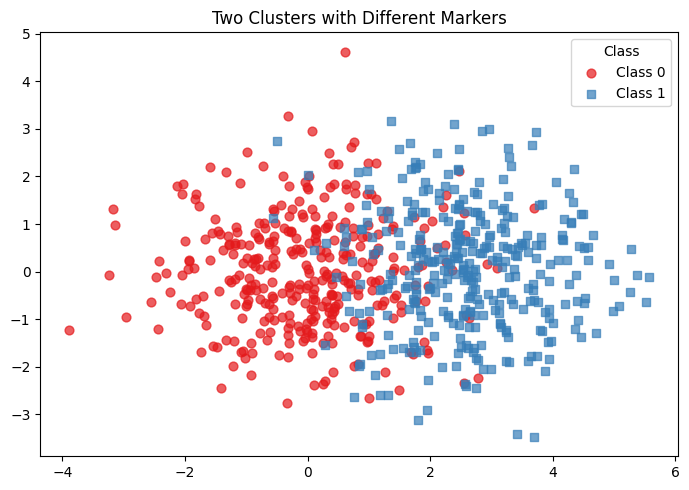

In [4]:
palette = sns.color_palette('Set1', n_colors=5)
def plot_clusters(n_samples=1000, centers=3, cluster_std=1.2, markers={0: 'o', 1: 's'}, colors=None, title='Clusters', legend_names=None):
    # Generate data
    X, y = make_blobs(
        n_samples=n_samples, 
        centers=centers,
        cluster_std=cluster_std, 
        random_state=42
    )
    df = pd.DataFrame(X, columns=['feature1', 'feature2'])
    df['label'] = y

    plt.figure(figsize=(7, 5))
    markers = markers
    # Use provided colors or default palette
    if colors is None:
        palette = sns.color_palette('Set1', n_colors=len(np.unique(y)))
        colors = {label: palette[label] for label in np.unique(y)}
    else:
        # If colors is a list, convert to dict
        if isinstance(colors, list):
            colors = {label: colors[label] for label in np.unique(y)}
    
    for label in np.unique(y):
        subset = df[df['label'] == label]
        # Use custom legend name if provided, otherwise default
        legend_label = legend_names[label] if legend_names and label < len(legend_names) else f'Class {label}'
        plt.scatter(
            subset['feature1'], subset['feature2'],
            marker=markers.get(label, 'o'),
            color=colors.get(label, 'gray'),
            alpha=0.7, s=40, label=legend_label
        )
    plt.xlabel('')
    plt.ylabel('')
    plt.title(title)
    plt.legend(title='Class')
    plt.tight_layout()
    plt.savefig('clusters.svg', format='svg', bbox_inches='tight')
    plt.show()

plot_clusters(
    n_samples=700,
    centers=[(0,0), (2.5,0)],
    colors=[palette[0], palette[1]],  # Pass the palette directly
    markers={0: 'o', 1: 's'},
    title='Two Clusters with Different Markers'
)

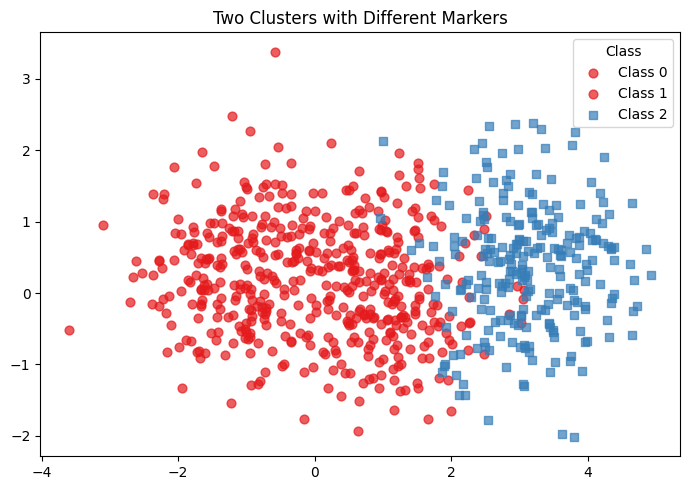

In [4]:
plot_clusters(
    n_samples=750,
    centers=[(-1,0.3), (1,0), (3,0.3)],
    cluster_std=0.8,
    colors=[palette[0], palette[0], palette[1]],  # Pass the palette directly
    markers={0: 'o', 1: 'o', 2: 's'},
    title='Two Clusters with Different Markers'
)

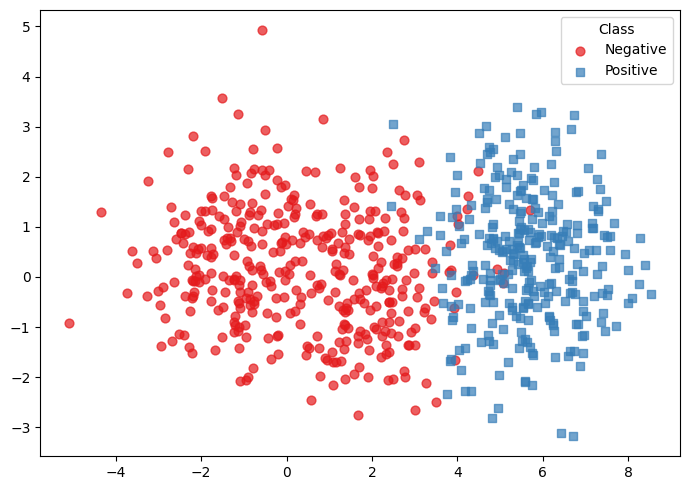

In [9]:
plot_clusters(
    n_samples=[200,200,300],
    centers=[(-1.2,0.3), (2,0), (5.5,0.3)],
    cluster_std=1.2,
    colors=[palette[0], palette[0], palette[1]],  # Pass the palette directly
    markers={0: 'o', 1: 'o', 2: 's'},
    legend_names=['Negative', '', 'Positive'],
    title=''
)

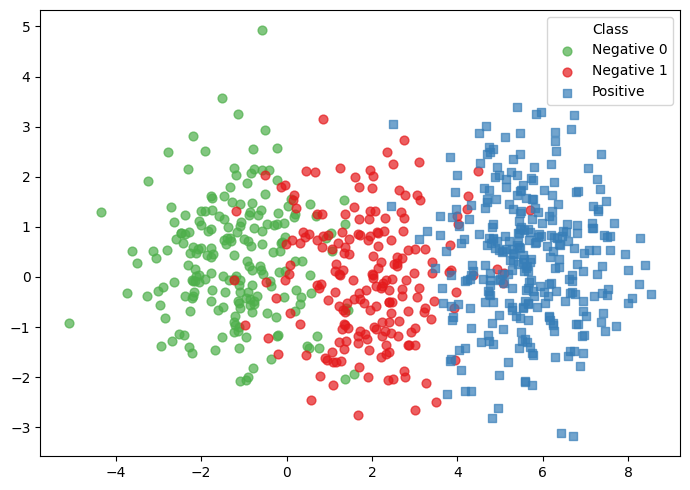

In [10]:
plot_clusters(
    n_samples=[200,200,300],
    centers=[(-1.2,0.3), (2,0), (5.5,0.3)],
    cluster_std=1.2,
    colors=[palette[2], palette[0], palette[1]],  # Pass the palette directly
    markers={0: 'o', 1: 'o', 2: 's'},
    legend_names=['Negative 0', 'Negative 1', 'Positive'],
    title=''
)

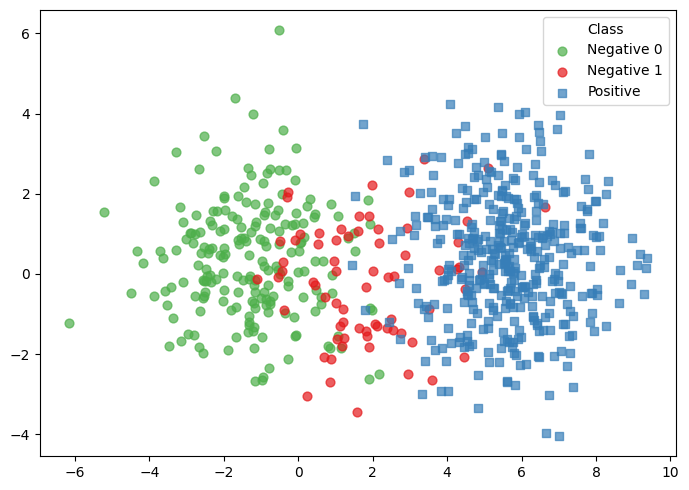

In [12]:
plot_clusters(
    n_samples=[200,70,400],
    centers=[(-1.3,0.3), (2,0), (5.5,0.3)],
    cluster_std=1.5,
    colors=[palette[2], palette[0], palette[1]],  # Pass the palette directly
    markers={0: 'o', 1: 'o', 2: 's'},
    legend_names=['Negative 0', 'Negative 1', 'Positive'],
    title=''
)

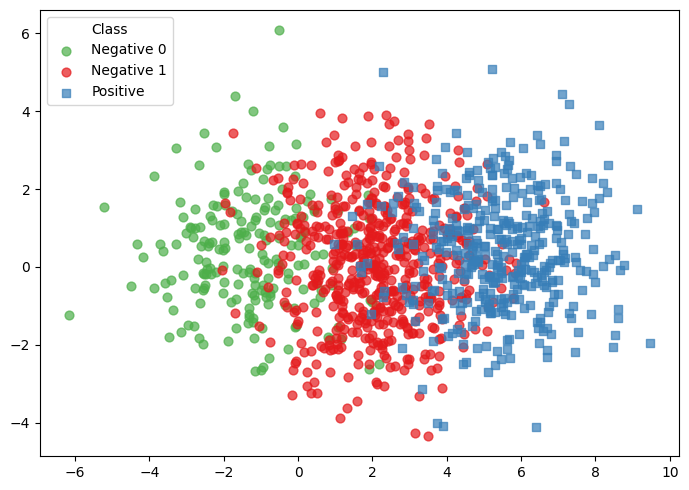

In [13]:
plot_clusters(
    n_samples=[200,550,400],
    centers=[(-1.3,0.3), (2,0), (5.5,0.3)],
    cluster_std=1.5,
    colors=[palette[2], palette[0], palette[1]],  # Pass the palette directly
    markers={0: 'o', 1: 'o', 2: 's'},
    legend_names=['Negative 0', 'Negative 1', 'Positive'],
    title=''
)

## Score density plots

In [15]:
def MoSS(n, alpha, m):
    p_score = np.random.uniform(size=int(n * alpha)) ** m
    n_score = 1 - (np.random.uniform(size=int(round(n * (1 - alpha), 0))) ** m)
    scores = np.column_stack((np.concatenate((p_score, n_score)), np.concatenate((np.ones(len(p_score)), np.full(len(n_score), 0)))))
    # pdb.set_trace()
    return scores

MoSS(1000, 0.5, 0.3)

array([[0.47386136, 1.        ],
       [0.30833531, 1.        ],
       [0.41551687, 1.        ],
       ...,
       [0.15519951, 0.        ],
       [0.10114871, 0.        ],
       [0.48674607, 0.        ]], shape=(1000, 2))

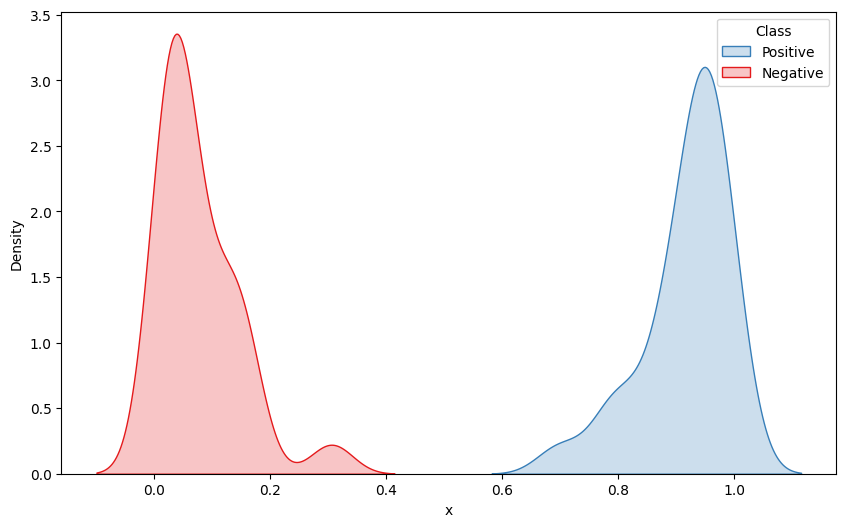

In [115]:
x=MoSS(50, 0.5, 0.1)
x = pd.DataFrame(x)
x.columns = ['x', 'col1']

def plot_density(x):
    # Create the density plot
    plt.figure(figsize=(10, 6))
    # sns.kdeplot(data=x, x='x', hue='col1', fill=True, palette=[palette[0], palette[1]])
    # Change column name and labels
    x['Class'] = x['col1'].map({0.0: 'Negative', 1.0: 'Positive'})
    sns.kdeplot(data=x, x='x', hue='Class', fill=True, palette=[palette[1], palette[0]])

    plt.title('')
    plt.xlabel('x')
    plt.ylabel('Density')
    plt.savefig('density_plot.svg', format='svg', bbox_inches='tight')
    plt.show()

plot_density(x)


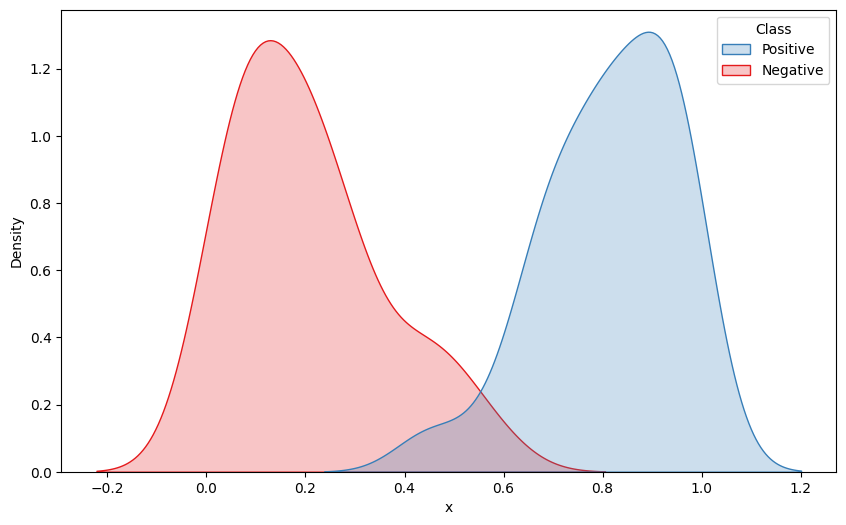

In [244]:
x=MoSS(50, 0.5, 0.2)
x = pd.DataFrame(x)
x.columns = ['x', 'col1']

plot_density(x)

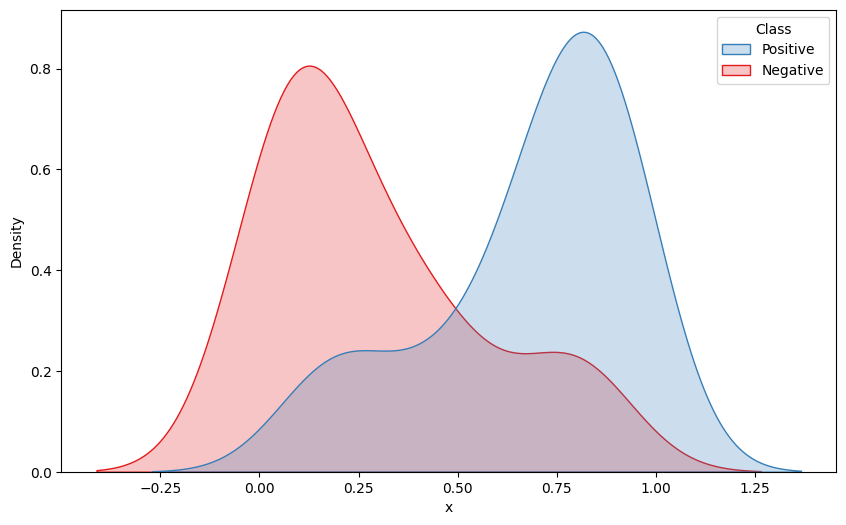

In [72]:
x=MoSS(50, 0.5, 0.4)
x = pd.DataFrame(x)
x.columns = ['x', 'col1']

plot_density(x)

# Results

In [2]:
results_path = './results_paper/'

## Synthetic

In [3]:
df_syn = pd.read_csv(results_path + 'results_syn_t50.csv')

# fix HDy values in P_1 and AE columns
# import ast
# mask = df_syn['Qnt'].isin(['HDy', 'HDySyn'])
# df_syn.loc[mask, 'P_1'] = df_syn.loc[mask, 'P_1'].apply(lambda x: ast.literal_eval(x.replace(' ', ','))[0])
# df_syn.loc[mask, 'AE'] = abs(df_syn.loc[mask, 'P_1'] - df_syn.loc[mask, 'R_1'])

df_syn

,MFtr,MFte,R_1,P_1,AE,Distance,Qnt
0,0.05,0.05,0.0,0.00,0.00,NaN,CC
1,0.05,0.05,0.0,0.00,0.00,NaN,ACC
2,0.05,0.05,0.0,0.00,0.00,topsoe,ACCSyn-TS
3,0.05,0.05,0.0,0.00,0.00,NaN,T50
4,0.05,0.05,0.0,0.00,0.00,topsoe,T50Syn-TS
...,...,...,...,...,...,...,...
8021415,0.95,0.95,1.0,0.56,0.44,topsoe,DySyn-TS
8021416,0.95,0.95,1.0,0.00,1.00,NaN,SMM
8021417,0.95,0.95,1.0,0.90,0.10,topsoe,SMMSyn-TS
8021418,0.95,0.95,1.0,1.00,0.00,NaN,HDy


In [4]:
df_syn['Type'] = df_syn['Qnt'].apply(lambda q: 'synthetic' if 'Syn' in str(q) else 'classic')

In [5]:
valid_df = df_syn[df_syn['MFte'] <= df_syn['MFtr']]


In [ ]:
import plotly.express as px

fig = px.box(
    valid_df,
    x="Type",
    y="AE",
    points="outliers",
    color="Type",  # Different colors for each type
    color_discrete_map={"classic": "royalblue", "synthetic": "orange"},
    title="AE Boxplot: Classic vs Synthetic"
)
fig.show()

In [ ]:
import plotly.express as px

fig = px.box(
    df_syn,
    x="Type",
    y="AE",
    points="outliers",
    color="Type",  # Different colors for each type
    color_discrete_map={"classic": "royalblue", "synthetic": "orange"},
    title="AE Boxplot: Classic vs Synthetic"
)
fig.show()

In [ ]:
mftr_7 = df_syn[df_syn['MFtr'] == 0.7]
mftr_7

,MFtr,MFte,R_1,P_1,AE,Distance,Qnt,Type
5488340,0.7,0.05,0.0,0.000,0.00,NaN,CC,classic
5488341,0.7,0.05,0.0,0.000,0.00,NaN,ACC,classic
5488342,0.7,0.05,0.0,0.000,0.00,topsoe,ACCSyn-TS,synthetic
5488343,0.7,0.05,0.0,0.000,0.00,NaN,T50,classic
5488344,0.7,0.05,0.0,0.000,0.00,topsoe,T50Syn-TS,synthetic
...,...,...,...,...,...,...,...,...
5910515,0.7,0.95,1.0,0.560,0.44,topsoe,DySyn-TS,synthetic
5910516,0.7,0.95,1.0,0.510,0.49,NaN,SMM,classic
5910517,0.7,0.95,1.0,0.650,0.35,topsoe,SMMSyn-TS,synthetic
5910518,0.7,0.95,1.0,0.577,0.42,NaN,HDy,classic


In [ ]:
import ipywidgets as widgets
from IPython.display import display, clear_output

import plotly.express as px

def plot_ae_boxplot_by_mftr(df_syn):
    mftr_values = sorted(df_syn['MFtr'].unique())
    dropdown = widgets.Dropdown(
        options=mftr_values,
        value=mftr_values[0],
        description='MFtr:'
    )

    def update_plot(change):
        selected_mftr = dropdown.value
        filtered = df_syn[df_syn['MFtr'] == selected_mftr]
        fig = px.box(
            filtered,
            x="MFte",
            y="AE",
            color="Type",
            points="outliers",
            category_orders={"Type": ["synthetic", "classic"]},
            title=f"AE Boxplot per MFte for MFtr={selected_mftr}"
        )
        # Add black box around the selected MFtr value
        fig.add_shape(
            type="rect",
            x0=0.025,
            x1=selected_mftr + 0.025,
            y0=0,
            y1=1,
            yref="paper",
            line=dict(color="black", width=2, dash="dash"),
            fillcolor="rgba(0,0,0,0)"
        )
        clear_output(wait=True)
        display(dropdown)
        display(fig)

    dropdown.observe(update_plot, names='value')
    display(dropdown)
    update_plot(None)

plot_ae_boxplot_by_mftr(df_syn)

Dropdown(description='MFtr:', index=13, options=(np.float64(0.05), np.float64(0.1), np.float64(0.15), np.float…

In [ ]:
import plotly.express as px

fig = px.box(
    df_syn,
    x="MFtr",
    y="AE",
    color="Type",
    points="outliers",
    category_orders={"Type": ["classic", "synthetic"]},
    # color_discrete_map={"classic": "royalblue", "synthetic": "orange"},
    title="AE Boxplot: Classic vs Synthetic per MFtr"
)
fig.show()

In [ ]:
def mae_error_mftr_plotly(df_syn):
    grouped = df_syn.groupby(['Qnt', 'MFte', 'MFtr']).agg({'AE': 'mean'}).reset_index()

    mftr_dropdown = widgets.Dropdown(
        options=grouped['MFtr'].unique(),
        description='MFtr:'
    )

    mftr_dropdown.value = grouped['MFtr'].unique()[0]

    def update_plot(change):
        selected_mftr = mftr_dropdown.value
        filtered_data = grouped[grouped['MFtr'] == selected_mftr]

        fig = go.Figure()
        for qnt_val in filtered_data['Qnt'].unique():
            if qnt_val in ['CC', 'ACC', 'PCC', 'PACC', 'PCCSyn-TS', 'PACCSyn-TS']:
                qnt_data = filtered_data[filtered_data['Qnt'] == qnt_val]
                # Show ACC and ACCSyn by default, others as legendonly
                visible = True if qnt_val in ['ACC', 'ACCSyn-TS'] else 'legendonly'
                fig.add_trace(go.Scatter(
                    x=qnt_data['MFte'],
                    y=qnt_data['AE'],
                    mode='lines+markers',
                    name=qnt_val,
                    # visible=visible
                ))

        fig.update_layout(title=f'MAE vs MFte for MFtr = {selected_mftr}',
                        xaxis_title='MFte',
                        yaxis_title='MAE')

        clear_output(wait=True)
        display(fig)
        display(mftr_dropdown)

    mftr_dropdown.observe(update_plot, names='value')
    display(mftr_dropdown)
    update_plot(None)
mae_error_mftr_plotly(df_syn)

Dropdown(description='MFtr:', options=(np.float64(0.05), np.float64(0.1), np.float64(0.15), np.float64(0.2), n…

Dropdown(description='MFtr:', options=(np.float64(0.05), np.float64(0.1), np.float64(0.15), np.float64(0.2), n…

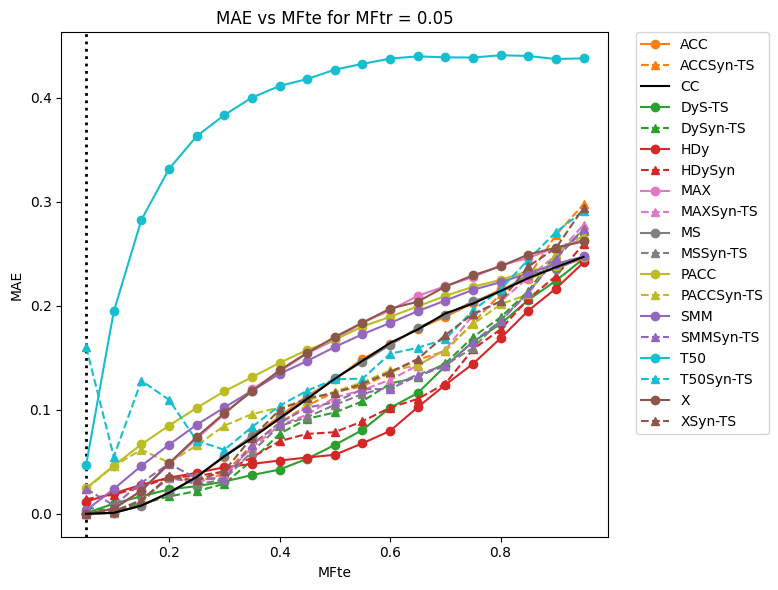

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display, clear_output
import matplotlib

# Define a color map so that each method and its Syn variant share the same color
method_pairs = [
    ('CC', 'CCSyn-TS'),
    ('ACC', 'ACCSyn-TS'),
    ('DyS-TS', 'DySyn-TS'),
    ('HDy', 'HDySyn'),
    ('SMM', 'SMMSyn-TS'),
    ('X', 'XSyn-TS'),
    ('MAX', 'MAXSyn-TS'),
    ('MS', 'MSSyn-TS'),
    ('PACC', 'PACCSyn-TS'),
    ('T50', 'T50Syn-TS'),
]

# Use matplotlib's tab10 color palette for distinct colors
base_colors = matplotlib.cm.get_cmap('tab10', len(method_pairs))

color_map = {}
for idx, (classic, syn) in enumerate(method_pairs):
    color = base_colors(idx)
    color_map[classic] = color
    color_map[syn] = color

def mae_error_mftr_matplot(df_syn):
    grouped = df_syn.groupby(['Qnt', 'MFte', 'MFtr']).agg({'AE': 'mean'}).reset_index()

    mftr_dropdown = widgets.Dropdown(
        options=sorted(grouped['MFtr'].unique()),
        description='MFtr:'
    )

    mftr_dropdown.value = grouped['MFtr'].unique()[0]

    thr_qnt = ['CC', 'ACC', 'ACCSyn-TS', 'X', 'XSyn-TS', 'MAX', 'MAXSyn-TS', 'MS', 'MSSyn-TS', 'PACC', 'PACCSyn-TS', 'T50', 'T50Syn-TS']
    distr_qnt = ['CC', 'DyS-TS', 'DySyn-TS', 'HDy', 'HDySyn', 'SMM', 'SMMSyn-TS']
    qnt = thr_qnt + distr_qnt

    def update_plot(change):
        selected_mftr = mftr_dropdown.value
        filtered_data = grouped[grouped['MFtr'] == selected_mftr]

        plt.figure(figsize=(10, 6))
        
        for qnt_val in filtered_data['Qnt'].unique():
            qnt_data = filtered_data[filtered_data['Qnt'] == qnt_val]
            if 'Syn' in qnt_val:
                marker_style = '^'
                line_style = '--'
                z = 1
            else:
                if qnt_val == 'CC':
                    marker_style = None
                    line_style = '-'
                    z = 10  # Draw CC on top
                else:
                    marker_style = 'o'
                    line_style = '-'
                    z = 1

            if qnt_val in qnt:
                if qnt_val in color_map:
                    if qnt_val == 'CC':
                        plt.plot(
                            qnt_data['MFte'], qnt_data['AE'],
                            marker=marker_style, linestyle=line_style,
                            label=qnt_val, color='black', zorder=z
                        )
                    else:
                        plt.plot(
                            qnt_data['MFte'], qnt_data['AE'],
                            marker=marker_style, linestyle=line_style,
                            label=qnt_val, color=color_map[qnt_val], zorder=z
                        )

        plt.title(f'MAE vs MFte for MFtr = {selected_mftr}')
        plt.xlabel('MFte')
        plt.ylabel('MAE')
        # Place the legend outside the plot box
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
        plt.tight_layout(rect=[0, 0, 0.8, 1])  # Make room for the legend
        plt.axvline(selected_mftr, color='black', linestyle=':', linewidth=2, zorder=0)

        clear_output(wait=True)
        display(mftr_dropdown)
        plt.savefig('mae_vs_mftr_plot.pdf', format='pdf', bbox_inches='tight')
        plt.show()

    mftr_dropdown.observe(update_plot, names='value')
    display(mftr_dropdown)
    update_plot(None)
mae_error_mftr_matplot(df_syn)

Dropdown(description='MFtr:', options=(np.float64(0.05), np.float64(0.1), np.float64(0.15), np.float64(0.2), n…

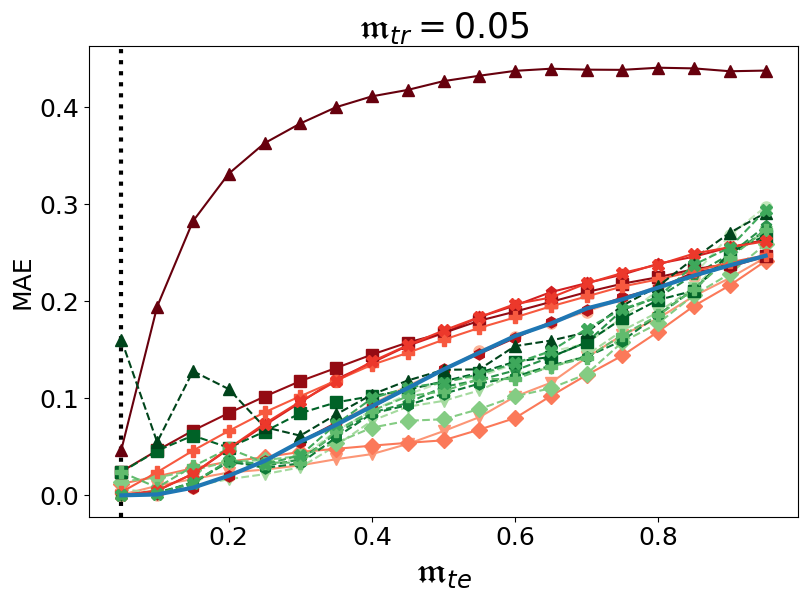

In [ ]:
import matplotlib

# Generate color palettes for classic (blue) and synthetic (orange) methods
n_methods = len(method_pairs)
classic_palette = matplotlib.cm.get_cmap('Reds', n_methods + 2)
syn_palette = matplotlib.cm.get_cmap('Greens', n_methods + 2)

# Assign a unique marker for each pair (example: cycle through a list or define your own)
pair_markers = ['', 'o', 'v', 'D', 'P', 'X', 'p', 'h', 's', '^']  # 10 unique markers

pair_marker_map = {}
for (classic, syn), marker in zip(method_pairs, pair_markers):
    pair_marker_map[classic] = marker
    pair_marker_map[syn] = marker

# Assign a unique color to each method in the pair
custom_color_map = {}
for idx, (classic_method, syn_method) in enumerate(method_pairs):
    if classic_method == 'CC':
        custom_color_map[classic_method] = 'tab:blue'  # light green RGBA
    else:
        custom_color_map[classic_method] = classic_palette(idx + 2)
    custom_color_map[syn_method] = syn_palette(idx + 2)

def mae_error_mftr_matplot(df_syn):
    grouped = df_syn.groupby(['Qnt', 'MFte', 'MFtr']).agg({'AE': 'mean'}).reset_index()

    mftr_dropdown = widgets.Dropdown(
        options=sorted(grouped['MFtr'].unique()),
        description='MFtr:'
    )

    mftr_dropdown.value = grouped['MFtr'].unique()[0]

    thr_qnt = ['CC', 'ACC', 'ACCSyn-TS', 'X', 'XSyn-TS', 'MAX', 'MAXSyn-TS', 'MS', 'MSSyn-TS', 'PACC', 'PACCSyn-TS', 'T50', 'T50Syn-TS']
    distr_qnt = ['CC', 'DyS-TS', 'DySyn-TS', 'HDy', 'HDySyn', 'SMM', 'SMMSyn-TS']
    qnt = thr_qnt + distr_qnt

    def update_plot(change):
        selected_mftr = mftr_dropdown.value
        filtered_data = grouped[grouped['MFtr'] == selected_mftr]

        plt.figure(figsize=(10, 6))
        
        for qnt_val in filtered_data['Qnt'].unique():
            qnt_data = filtered_data[filtered_data['Qnt'] == qnt_val]
            if 'Syn' in qnt_val:
                line_style = '--'
            else:
                line_style = '-'

            marker_style = pair_marker_map.get(qnt_val, 'o')
            color = custom_color_map.get(qnt_val, 'tab:gray')

            if qnt_val in qnt:
                if qnt_val == 'CC':
                    plt.plot(
                        qnt_data['MFte'], qnt_data['AE'],
                        marker=None, linestyle='-',
                        linewidth=3,
                        label=qnt_val, color=color, zorder=10
                    )
                else:
                    plt.plot(
                        qnt_data['MFte'],
                        qnt_data['AE'],
                        marker=marker_style,
                        markersize=8,
                        linestyle=line_style,
                        label=qnt_val,
                        color=color
                    )

        plt.title(fr'$\mathfrak{{m}}_{{tr}} = {selected_mftr:.2f}$', fontsize=25)
        plt.xlabel(fr'$\mathfrak{{m}}_{{te}}$', fontsize=25)
        plt.ylabel('MAE', fontsize=18)
        # Create a separate figure for the legend
        handles, labels = plt.gca().get_legend_handles_labels()
        # Desired legend order
        legend_order = thr_qnt + distr_qnt
        # Remove duplicates while preserving order
        seen = set()
        legend_order = [x for x in legend_order if not (x in seen or seen.add(x))]
        # Map label to handle
        label_handle_map = dict(zip(labels, handles))
        # Filter and order handles/labels
        ordered_labels = [lbl for lbl in legend_order if lbl in label_handle_map]
        ordered_handles = [label_handle_map[lbl] for lbl in ordered_labels]
        if ordered_handles:
            fig_legend = plt.figure(figsize=(8, 2))
            fig_legend.legend(ordered_handles, ordered_labels, loc='center', ncol=10, fontsize=18, frameon=False)
            fig_legend.tight_layout()
            fig_legend.savefig(f"{selected_mftr:.2f}_mae_vs_mftr_legend.svg", format='svg', bbox_inches='tight')
            plt.close(fig_legend)
        plt.tight_layout(rect=[0, 0, 0.8, 1])
        plt.axvline(selected_mftr, color='black', linestyle=':', linewidth=3, zorder=0)
        plt.xticks(fontsize=18)
        plt.yticks(fontsize=18)
        plt.savefig(f"{selected_mftr:.2f}_mae_vs_mftr_plot.svg", format='svg', bbox_inches='tight')

        clear_output(wait=True)
        display(mftr_dropdown)
        plt.show()

    mftr_dropdown.observe(update_plot, names='value')
    display(mftr_dropdown)
    update_plot(None)

mae_error_mftr_matplot(df_syn)


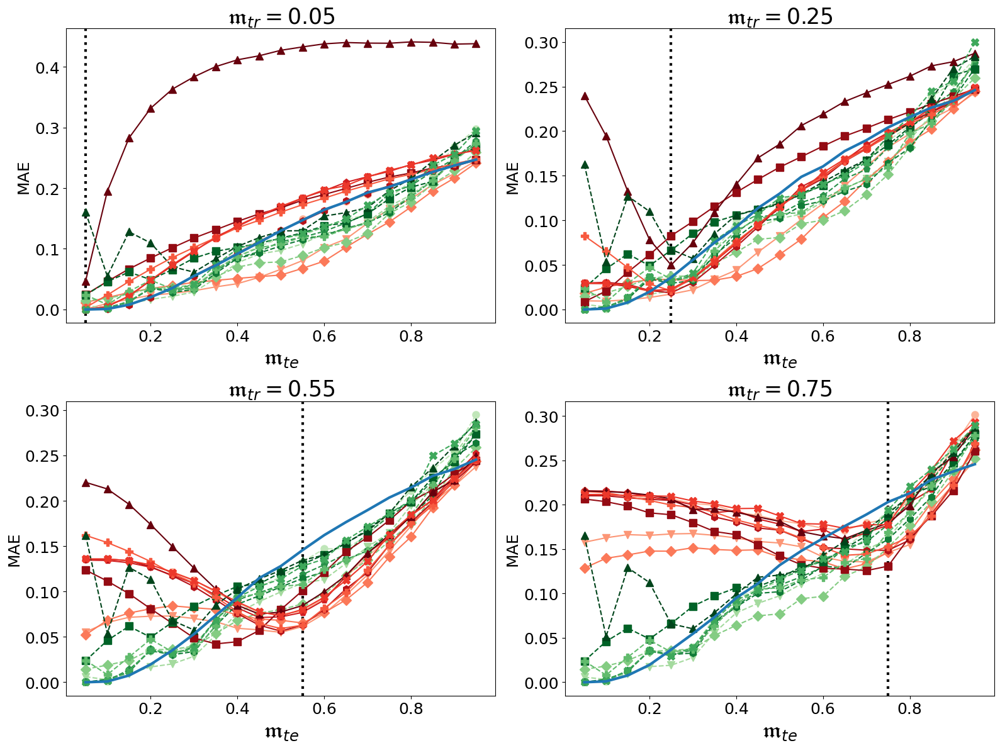

In [ ]:
mftr_values = [0.05, 0.25, 0.55, 0.75]
grouped = df_syn.groupby(['Qnt', 'MFte', 'MFtr']).agg({'AE': 'mean'}).reset_index()

thr_qnt = ['CC', 'ACC', 'ACCSyn-TS', 'X', 'XSyn-TS', 'MAX', 'MAXSyn-TS', 'MS', 'MSSyn-TS', 'PACC', 'PACCSyn-TS', 'T50', 'T50Syn-TS']
distr_qnt = ['CC', 'DyS-TS', 'DySyn-TS', 'HDy', 'HDySyn', 'SMM', 'SMMSyn-TS']
qnt = thr_qnt + distr_qnt

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for idx, selected_mftr in enumerate(mftr_values):
    ax = axes[idx]
    filtered_data = grouped[grouped['MFtr'] == selected_mftr]
    for qnt_val in filtered_data['Qnt'].unique():
        qnt_data = filtered_data[filtered_data['Qnt'] == qnt_val]
        if 'Syn' in qnt_val:
            line_style = '--'
        else:
            line_style = '-'
        marker_style = pair_marker_map.get(qnt_val, 'o')
        color = custom_color_map.get(qnt_val, 'tab:gray')
        if qnt_val in qnt:
            if qnt_val == 'CC':
                ax.plot(
                    qnt_data['MFte'], qnt_data['AE'],
                    marker=None, linestyle='-',
                    linewidth=3,
                    label=qnt_val, color=color, zorder=10
                )
            else:
                ax.plot(
                    qnt_data['MFte'],
                    qnt_data['AE'],
                    marker=marker_style,
                    markersize=8,
                    linestyle=line_style,
                    label=qnt_val,
                    color=color
                )
    ax.set_title(fr'$\mathfrak{{m}}_{{tr}} = {selected_mftr:.2f}$', fontsize=25)
    ax.set_xlabel(fr'$\mathfrak{{m}}_{{te}}$', fontsize=25)
    ax.set_ylabel('MAE', fontsize=18)
    ax.axvline(selected_mftr, color='black', linestyle=':', linewidth=3, zorder=0)
    ax.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=18)
    if idx == 0:
        handles, labels = ax.get_legend_handles_labels()
        # ax.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc='upper center', fontsize=10, ncol=9)

plt.tight_layout()
plt.show()

['ACC' 'ACCQuaDapt' 'CC' 'DyS' 'DyQuaDapt' 'HDy' 'HDyQuaDapt' 'MAX'
 'MAXQuaDapt' 'MS' 'MS2' 'MS2QuaDapt' 'MSQuaDapt' 'PACC' 'PACCQuaDapt'
 'PCC' 'SMM' 'SMMQuaDapt' 'T50' 'T50QuaDapt' 'X' 'XQuaDapt']
['ACC', 'ACCQuaDapt', 'X', 'XQuaDapt', 'CC', 'MAX', 'MAXQuaDapt', 'MS', 'MSQuaDapt', 'T50', 'T50QuaDapt', 'DyS', 'DySQuaDapt', 'HDy', 'HDyQuaDapt', 'SMM', 'SMMQuaDapt']


C:\Users\joaop\AppData\Local\Temp\ipykernel_1052\3968625678.py:40: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  classic_palette = matplotlib.cm.get_cmap('Reds', n_methods + 2)
C:\Users\joaop\AppData\Local\Temp\ipykernel_1052\3968625678.py:41: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  syn_palette = matplotlib.cm.get_cmap('Greens', n_methods + 2)


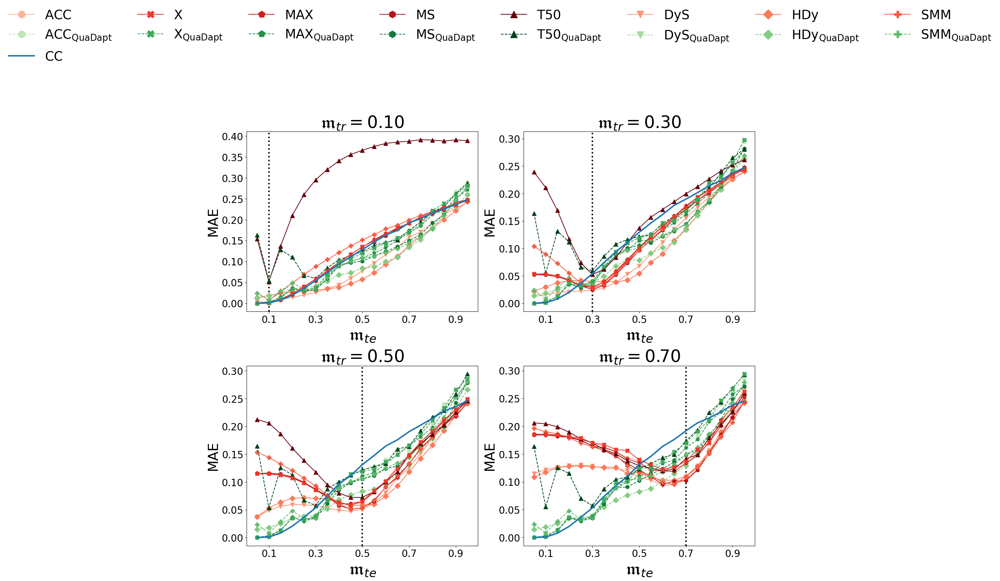

In [15]:
mftr_values = [0.10, 0.30, 0.50, 0.70]
grouped = df_syn.groupby(['Qnt', 'MFte', 'MFtr']).agg({'AE': 'mean'}).reset_index()

proposal = 'QuaDapt'
grouped['Qnt'] = grouped['Qnt'].apply(lambda x: x.replace('Syn', proposal) if 'Syn' in x else x)
grouped['Qnt'] = grouped['Qnt'].str.replace('-TS', '', regex=False)
print(grouped['Qnt'].unique())

thr_qnt = ['ACC', 'ACCSyn-TS', 'X', 'XSyn-TS', 'CC', 'MAX', 'MAXSyn-TS', 'MS', 'MSSyn-TS', 'T50', 'T50Syn-TS']
distr_qnt = ['DyS-TS', 'DySyn-TS', 'HDy', 'HDySyn', 'SMM', 'SMMSyn-TS']
qnt = thr_qnt + distr_qnt

qnt_quadapt = [q.replace('Syn', proposal) if q != 'DySyn-TS' else 'DySQuaDapt-TS' for q in qnt]
qnt = qnt_quadapt
qnt = [q.replace('-TS', '') for q in qnt]

print(qnt)

method_pairs = [
    ('CC', 'CCQuaDapt'),
    ('ACC', 'ACCQuaDapt'),
    ('DyS', 'DySQuaDapt'),
    ('HDy', 'HDyQuaDapt'),
    ('SMM', 'SMMQuaDapt'),
    ('X', 'XQuaDapt'),
    ('MAX', 'MAXQuaDapt'),
    ('MS', 'MSQuaDapt'),
    ('PACC', 'PACCQuaDapt'),
    ('T50', 'T50QuaDapt'),
]

def format_label(name):
    if name.endswith('QuaDapt'):
        base = name.replace('QuaDapt', '')
        return fr"$\mathrm{{{base}}}_{{\mathrm{{QuaDapt}}}}$"
    else:
        return fr"$\mathrm{{{name}}}$"

n_methods = len(method_pairs)
classic_palette = matplotlib.cm.get_cmap('Reds', n_methods + 2)
syn_palette = matplotlib.cm.get_cmap('Greens', n_methods + 2)

# Assign a unique marker for each pair (example: cycle through a list or define your own)
pair_markers = ['', 'o', 'v', 'D', 'P', 'X', 'p', 'h', 's', '^']  # 10 unique markers

pair_marker_map = {}
for (classic, syn), marker in zip(method_pairs, pair_markers):
    pair_marker_map[classic] = marker
    pair_marker_map[syn] = marker

# Assign a unique color to each method in the pair
custom_color_map = {}
for idx, (classic_method, syn_method) in enumerate(method_pairs):
    if classic_method == 'CC':
        custom_color_map[classic_method] = 'tab:blue'
    else:
        custom_color_map[classic_method] = classic_palette(idx + 2)
    custom_color_map[syn_method] = syn_palette(idx + 2)

# Prepare handles and labels for the legend
lines = []
labels = []
for qnt_val in qnt:
    if proposal in qnt_val:
        line_style = '--'
    else:
        line_style = '-'
    marker_style = pair_marker_map.get(qnt_val, 'o')
    color = custom_color_map.get(qnt_val, 'tab:gray')
    if qnt_val == 'CC':
        line, = plt.plot([], [], marker=None, linestyle='-', linewidth=3, label=qnt_val, color=color)
    else:
        line, = plt.plot([], [], marker=marker_style, markersize=8, linestyle=line_style, label=qnt_val, color=color)
    lines.append(line)
    labels.append(format_label(qnt_val))
plt.close()  # Close the dummy plot

# Create the subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 14)) #(16, 12)
axes = axes.flatten()

for idx, selected_mftr in enumerate(mftr_values):
    ax = axes[idx]
    filtered_data = grouped[grouped['MFtr'] == selected_mftr]
    for qnt_val in filtered_data['Qnt'].unique():
        qnt_data = filtered_data[filtered_data['Qnt'] == qnt_val]
        if proposal in qnt_val:
            line_style = '--'
        else:
            line_style = '-'
        marker_style = pair_marker_map.get(qnt_val, 'o')
        color = custom_color_map.get(qnt_val, 'tab:gray')
        if qnt_val in qnt:
            if qnt_val == 'CC':
                ax.plot(
                    qnt_data['MFte'], qnt_data['AE'],
                    marker=None, linestyle='-',
                    linewidth=3,
                    label=qnt_val, color=color, zorder=10
                )
            else:
                ax.plot(
                    qnt_data['MFte'],
                    qnt_data['AE'],
                    marker=marker_style,
                    markersize=8,
                    linestyle=line_style,
                    label=qnt_val,
                    color=color
                )
    ax.set_title(fr'$\mathfrak{{m}}_{{tr}} = {selected_mftr:.2f}$', fontsize=35)
    ax.set_xlabel(fr'$\mathfrak{{m}}_{{te}}$', fontsize=35)
    ax.set_ylabel('MAE', fontsize=28)
    ax.axvline(selected_mftr, color='black', linestyle=':', linewidth=3, zorder=0)
    ax.tick_params(axis='x', labelsize=20)
    ax.tick_params(axis='y', labelsize=20)
    ax.set_xticks([0.10, 0.30, 0.50, 0.70, 0.90])

    # Define the desired legend order
    legend_order = ['ACC', 'ACCQuaDapt', 'CC', 'X', 'XQuaDapt', 'MAX', 'MAXQuaDapt', 'MS', 'MSQuaDapt', 'T50', 'T50QuaDapt', 'DyS', 'DySQuaDapt', 'HDy', 'HDyQuaDapt', 'SMM', 'SMMQuaDapt']

    # Reorder lines and labels according to the desired order
    ordered_lines = []
    ordered_labels = []
    for method in legend_order:
        if method in qnt:
            idx = qnt.index(method)
            ordered_lines.append(lines[idx])
            ordered_labels.append(labels[idx])

    # Update lines and labels
    lines = ordered_lines
    labels = ordered_labels

# Add the legend above all subplots
fig.legend(
    handles=lines, labels=labels,
    loc='upper center', bbox_to_anchor=(0.535, 1.20),
        ncol=8, fontsize=26.5, frameon=False, markerscale=1.8,
)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.savefig('test4.svg', format='svg', bbox_inches='tight')
plt.show()

['ACC' 'ACCQuaDapt' 'CC' 'DyS' 'DySQuaDapt' 'HDy' 'HDyQuaDapt' 'MAX'
 'MAXQuaDapt' 'MS' 'MS2' 'MS2QuaDapt' 'MSQuaDapt' 'PACC' 'PACCQuaDapt'
 'PCC' 'SMM' 'SMMQuaDapt' 'T50' 'T50QuaDapt' 'X' 'XQuaDapt']
['ACC' 'ACCQuaDapt' 'CC' 'DyS' 'DySQuaDapt' 'HDy' 'HDyQuaDapt' 'MAX'
 'MAXQuaDapt' 'MS' 'MS2' 'MS2QuaDapt' 'MSQuaDapt' 'PACC' 'PACCQuaDapt'
 'PCC' 'SMM' 'SMMQuaDapt' 'T50' 'T50QuaDapt' 'X' 'XQuaDapt']
['$\\mathrm{ACC}$', '$\\mathrm{ACC}_{\\mathrm{QuaDapt}}$', '$\\mathrm{CC}$', '$\\mathrm{X}$', '$\\mathrm{X}_{\\mathrm{QuaDapt}}$', '$\\mathrm{DyS}$', '$\\mathrm{MAX}$', '$\\mathrm{MAX}_{\\mathrm{QuaDapt}}$', '$\\mathrm{DyS}_{\\mathrm{QuaDapt}}$', '$\\mathrm{MS}$', '$\\mathrm{MS}_{\\mathrm{QuaDapt}}$', '$\\mathrm{T50}$', '$\\mathrm{T50}_{\\mathrm{QuaDapt}}$', '$\\mathrm{HDy}$', '$\\mathrm{HDy}_{\\mathrm{QuaDapt}}$', '$\\mathrm{SMM}$', '$\\mathrm{SMM}_{\\mathrm{QuaDapt}}$']


C:\Users\joaop\AppData\Local\Temp\ipykernel_1052\3597608938.py:39: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  classic_palette = matplotlib.cm.get_cmap('Reds', n_methods + 2)
C:\Users\joaop\AppData\Local\Temp\ipykernel_1052\3597608938.py:40: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  syn_palette = matplotlib.cm.get_cmap('Greens', n_methods + 2)


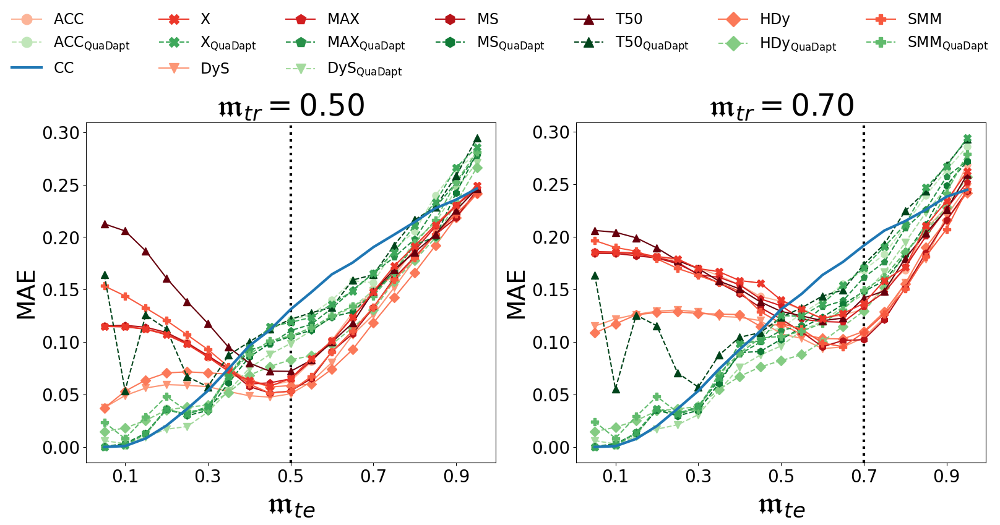

In [ ]:
mftr_values = [0.50, 0.70]  # Only 0.50 and 0.70
grouped = df_syn.groupby(['Qnt', 'MFte', 'MFtr']).agg({'AE': 'mean'}).reset_index()

proposal = 'QuaDapt'
grouped['Qnt'] = grouped['Qnt'].apply(lambda x: 'DySQuaDapt' if x == 'DySyn-TS' else (x.replace('Syn', proposal) if 'Syn' in x else x))
grouped['Qnt'] = grouped['Qnt'].str.replace('-TS', '', regex=False)

print(grouped['Qnt'].unique())

thr_qnt = ['ACC', 'ACCSyn-TS', 'X', 'XSyn-TS', 'CC', 'MAX', 'MAXSyn-TS', 'MS', 'MSSyn-TS', 'T50', 'T50Syn-TS']
distr_qnt = ['DyS-TS', 'DySyn-TS', 'HDy', 'HDySyn', 'SMM', 'SMMSyn-TS']
qnt = thr_qnt + distr_qnt

qnt_quadapt = [q.replace('Syn', proposal) if q != 'DySyn-TS' else 'DySQuaDapt-TS' for q in qnt]
qnt = qnt_quadapt
qnt = [q.replace('-TS', '') for q in qnt]

method_pairs = [
    ('CC', 'CCQuaDapt'),
    ('ACC', 'ACCQuaDapt'),
    ('DyS', 'DySQuaDapt'),
    ('HDy', 'HDyQuaDapt'),
    ('SMM', 'SMMQuaDapt'),
    ('X', 'XQuaDapt'),
    ('MAX', 'MAXQuaDapt'),
    ('MS', 'MSQuaDapt'),
    ('PACC', 'PACCQuaDapt'),
    ('T50', 'T50QuaDapt'),
]

def format_label(name):
    if name.endswith('QuaDapt'):
        base = name.replace('QuaDapt', '')
        return fr"$\mathrm{{{base}}}_{{\mathrm{{QuaDapt}}}}$"
    else:
        return fr"$\mathrm{{{name}}}$"

n_methods = len(method_pairs)
classic_palette = matplotlib.cm.get_cmap('Reds', n_methods + 2)
syn_palette = matplotlib.cm.get_cmap('Greens', n_methods + 2)

# Assign a unique marker for each pair (example: cycle through a list or define your own)
pair_markers = ['', 'o', 'v', 'D', 'P', 'X', 'p', 'h', 's', '^']  # 10 unique markers

pair_marker_map = {}
for (classic, syn), marker in zip(method_pairs, pair_markers):
    pair_marker_map[classic] = marker
    pair_marker_map[syn] = marker

# Assign a unique color to each method in the pair
custom_color_map = {}
for idx, (classic_method, syn_method) in enumerate(method_pairs):
    if classic_method == 'CC':
        custom_color_map[classic_method] = 'tab:blue'
    else:
        custom_color_map[classic_method] = classic_palette(idx + 2)
    custom_color_map[syn_method] = syn_palette(idx + 2)

# Prepare handles and labels for the legend
lines = []
labels = []
for qnt_val in qnt:
    if proposal in qnt_val:
        line_style = '--'
    else:
        line_style = '-'
    marker_style = pair_marker_map.get(qnt_val, 'o')
    color = custom_color_map.get(qnt_val, 'tab:gray')
    if qnt_val == 'CC':
        line, = plt.plot([], [], marker=None, linestyle='-', linewidth=3, label=qnt_val, color=color)
    else:
        line, = plt.plot([], [], marker=marker_style, markersize=8, linestyle=line_style, label=qnt_val, color=color)
    lines.append(line)
    labels.append(format_label(qnt_val))
plt.close()  # Close the dummy plot

# Create the subplots - 1x2 layout for 2 MFtr values
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

for idx, selected_mftr in enumerate(mftr_values):
    ax = axes[idx]
    filtered_data = grouped[grouped['MFtr'] == selected_mftr]
    for qnt_val in filtered_data['Qnt'].unique():
        qnt_data = filtered_data[filtered_data['Qnt'] == qnt_val]
        if proposal in qnt_val:
            line_style = '--'
        else:
            line_style = '-'
        marker_style = pair_marker_map.get(qnt_val, 'o')
        color = custom_color_map.get(qnt_val, 'tab:gray')
        if qnt_val in qnt:
            if qnt_val == 'CC':
                ax.plot(
                    qnt_data['MFte'], qnt_data['AE'],
                    marker=None, linestyle='-',
                    linewidth=3,
                    label=qnt_val, color=color, zorder=10
                )
            else:
                ax.plot(
                    qnt_data['MFte'],
                    qnt_data['AE'],
                    marker=marker_style,
                    markersize=8,
                    linestyle=line_style,
                    label=qnt_val,
                    color=color
                )
    ax.set_title(fr'$\mathfrak{{m}}_{{tr}} = {selected_mftr:.2f}$', fontsize=35)
    ax.set_xlabel(fr'$\mathfrak{{m}}_{{te}}$', fontsize=35)
    ax.set_ylabel('MAE', fontsize=28)
    ax.axvline(selected_mftr, color='black', linestyle=':', linewidth=3, zorder=0)
    ax.tick_params(axis='x', labelsize=20)
    ax.tick_params(axis='y', labelsize=20)
    ax.set_xticks([0.10, 0.30, 0.50, 0.70, 0.90])

# Define desired legend order (exactly as you want it to appear)
legend_order = [
    'ACC', 'ACCQuaDapt',
    'CC', 'X', 'XQuaDapt',
    'DyS', 'MAX',
    'MAXQuaDapt', 'DySQuaDapt',
    'MS', 'MSQuaDapt',
    'T50', 'T50QuaDapt',
    'HDy', 'HDyQuaDapt',
    'SMM', 'SMMQuaDapt',
]

# After plotting all subplots, grab unique legend entries
handles, labels = [], []
for ax in axes:
    h, l = ax.get_legend_handles_labels()
    handles.extend(h)
    labels.extend(l)

# Make unique and keep your order
label_to_handle = dict(zip(labels, handles))
ordered_handles = [label_to_handle[l] for l in legend_order if l in label_to_handle]
ordered_labels = [format_label(l) for l in legend_order if l in label_to_handle]
print(filtered_data['Qnt'].unique())
# Add the legend above all subplots
print(ordered_labels)
fig.legend(
    handles=ordered_handles,
    labels=ordered_labels,
    loc='upper center',
    bbox_to_anchor=(0.5, 1.07),
    ncol=7,
    fontsize=17.0,
    frameon=False,
    markerscale=1.5,
)

plt.tight_layout(rect=[0, 0, 1, 0.9])
plt.savefig('test4.svg', format='svg', bbox_inches='tight')
plt.show()

## Real

In [3]:
df_real = pd.read_csv(results_path + 'lequa2025_results_datasets.csv')
df_real.rename({'error': 'AE', 'quantifier': 'Qnt', 'harderDistr': 'H'}, axis=1, inplace=True)
df_real

,actual+,actual-,predict+,predict-,AE,testSize,Qnt,H,dataset
0,0.01,0.99,0.010000,0.990000,0.00,100,CC,0.0,Avila
1,0.01,0.99,0.000000,1.000000,0.01,100,HDy-LP,0.0,Avila
2,0.01,0.99,0.020000,0.980000,0.01,100,HDySyn,0.0,Avila
3,0.01,0.99,0.000000,1.000000,0.01,100,ACC,0.0,Avila
4,0.01,0.99,0.010020,0.989980,0.00,100,ACCSyn,0.0,Avila
...,...,...,...,...,...,...,...,...,...
1151395,1.00,0.00,1.000000,0.000000,0.00,100,T50Syn,1.0,Walking
1151396,1.00,0.00,0.999996,0.000004,0.00,100,DyS-TS,1.0,Walking
1151397,1.00,0.00,0.980000,0.020000,0.02,100,DySyn-TS,1.0,Walking
1151398,1.00,0.00,1.000000,0.000000,0.00,100,SMM,1.0,Walking


In [165]:
df_updated = pd.read_csv(results_path + 'lequa2025_results_datasets_updated.csv')
df_updated.rename({'error': 'AE', 'quantifier': 'Qnt', 'harderDistr': 'H'}, axis=1, inplace=True)
df_updated

,Qnt,dataset,AE,H,actual+
0,CC,Covertype,0.02,0.0,0.01
1,HDy-LP,Covertype,0.01,0.0,0.01
2,HDySyn,Covertype,0.00,0.0,0.01
3,ACC,Covertype,0.01,0.0,0.01
4,ACCSyn,Covertype,0.02,0.0,0.01
...,...,...,...,...,...
191895,T50Syn,Walking,0.04,1.0,1.00
191896,DyS-TS,Walking,0.00,1.0,1.00
191897,DySyn-TS,Walking,0.12,1.0,1.00
191898,SMM,Walking,0.05,1.0,1.00


In [166]:
df_real = df_real[~df_real['dataset'].isin(['Covertype', 'Walking'])]
df_real['dataset'].unique()

array(['Avila', 'Chess game', 'Dermatology', 'HAR', 'Land-use', 'Mfeat',
       'Mosquitoes', 'Nursery', 'Phishing URL', 'Satimage'], dtype=object)

In [167]:
df_real = pd.concat([df_real, df_updated], ignore_index=True)
df_real

,actual+,actual-,predict+,predict-,AE,testSize,Qnt,H,dataset
0,0.01,0.99,0.01000,0.99000,0.00,100.0,CC,0.0,Avila
1,0.01,0.99,0.00000,1.00000,0.01,100.0,HDy-LP,0.0,Avila
2,0.01,0.99,0.02000,0.98000,0.01,100.0,HDySyn,0.0,Avila
3,0.01,0.99,0.00000,1.00000,0.01,100.0,ACC,0.0,Avila
4,0.01,0.99,0.01002,0.98998,0.00,100.0,ACCSyn,0.0,Avila
...,...,...,...,...,...,...,...,...,...
1151395,1.00,NaN,NaN,NaN,0.04,NaN,T50Syn,1.0,Walking
1151396,1.00,NaN,NaN,NaN,0.00,NaN,DyS-TS,1.0,Walking
1151397,1.00,NaN,NaN,NaN,0.12,NaN,DySyn-TS,1.0,Walking
1151398,1.00,NaN,NaN,NaN,0.05,NaN,SMM,1.0,Walking


### Boxplot per dataset

In [ ]:
def plot_ae_boxplots_by_dataset(df_real):
    datasets = list(df_real['dataset'].unique())
    datasets.insert(0, 'All')
    dropdown = widgets.Dropdown(
        options=datasets,
        description='Dataset:'
    )

    def update_plot(change):
        selected_dataset = dropdown.value
        if selected_dataset == 'All':
            filtered = df_real
        else:
            filtered = df_real[df_real['dataset'] == selected_dataset]
        fig = go.Figure()
        for qnt in filtered['Qnt'].unique():
            qnt_data = filtered[filtered['Qnt'] == qnt]['AE']
            fig.add_trace(go.Box(
                y=qnt_data,
                name=qnt,
                width=0.5
            ))
        fig.update_layout(
            title=f'AE Boxplots per Qnt for {selected_dataset}',
            yaxis_title='AE',
            xaxis_title='Qnt',
            boxmode='group',
        )
        clear_output(wait=True)
        display(fig)
        display(dropdown)

    dropdown.observe(update_plot, names='value')
    display(dropdown)
    update_plot(None)

plot_ae_boxplots_by_dataset(df_real)

Dropdown(description='Dataset:', index=5, options=('All', 'Avila', 'Chess game', 'Covertype', 'Dermatology', '…

### Boxplot ranking per dataset (MAE)

In [178]:
grouped_real = df_real.groupby(['dataset', 'Qnt']).agg({'AE': 'mean'}).reset_index()
grouped_real[grouped_real['dataset'] == 'Avila'].sort_values('AE', ascending=True)

,dataset,Qnt,AE
4,Avila,DySyn-TS,0.044251
18,Avila,XSyn,0.045988
1,Avila,ACCSyn,0.046368
6,Avila,HDySyn,0.048727
8,Avila,MAXSyn,0.050341
11,Avila,PACC,0.053943
2,Avila,CC,0.056123
17,Avila,X,0.059689
0,Avila,ACC,0.064671
3,Avila,DyS-TS,0.064840


In [181]:
# Create a summary dataframe with MAE and standard deviation
mae_std_df = df_real.groupby(['dataset', 'Qnt']).agg({
    'AE': ['mean', 'std']
}).reset_index()

# Flatten column names
mae_std_df.columns = ['dataset', 'Qnt', 'MAE', 'STD']

# Format the values with 3 decimals and combine MAE with STD in parentheses
mae_std_df['MAE_STD'] = mae_std_df.apply(
    lambda row: f"{row['MAE']:.3f} ({row['STD']:.3f})", axis=1
)

# Pivot to get quantifiers as columns
mae_std_pivot = mae_std_df.pivot(index='dataset', columns='Qnt', values='MAE_STD')

mae_std_pivot

Qnt,ACC,ACCSyn,CC,DyS-TS,DySyn-TS,HDy-LP,HDySyn,MAX,MAXSyn,MS,MSSyn,PACC,PACCSyn,SMM,SMMSyn,T50,T50Syn,X,XSyn
dataset,,,,,,,,,,,,,,,,,,,
Avila,0.065 (0.044),0.046 (0.054),0.056 (0.039),0.065 (0.047),0.044 (0.051),0.079 (0.055),0.049 (0.047),0.070 (0.061),0.050 (0.061),0.156 (0.118),0.074 (0.060),0.054 (0.040),0.100 (0.069),0.102 (0.063),0.090 (0.068),0.153 (0.110),0.094 (0.092),0.060 (0.041),0.046 (0.054)
Chess game,0.052 (0.037),0.031 (0.026),0.045 (0.033),0.035 (0.029),0.030 (0.027),0.048 (0.036),0.039 (0.031),0.046 (0.038),0.034 (0.030),0.109 (0.071),0.060 (0.049),0.049 (0.034),0.085 (0.052),0.070 (0.044),0.065 (0.048),0.127 (0.088),0.088 (0.086),0.046 (0.033),0.030 (0.027)
Covertype,0.059 (0.045),0.057 (0.055),0.077 (0.053),0.062 (0.050),0.060 (0.054),0.072 (0.057),0.059 (0.050),0.071 (0.057),0.062 (0.064),0.085 (0.063),0.096 (0.070),0.092 (0.054),0.114 (0.076),0.079 (0.058),0.091 (0.064),0.073 (0.059),0.121 (0.104),0.070 (0.054),0.056 (0.054)
Dermatology,0.002 (0.005),0.002 (0.005),0.002 (0.005),0.002 (0.005),0.010 (0.010),0.008 (0.008),0.050 (0.044),0.002 (0.005),0.002 (0.005),0.022 (0.019),0.120 (0.106),0.012 (0.009),0.014 (0.010),0.006 (0.006),0.036 (0.023),0.089 (0.067),0.211 (0.127),0.003 (0.006),0.002 (0.005)
HAR,0.026 (0.020),0.017 (0.015),0.017 (0.015),0.016 (0.013),0.013 (0.011),0.038 (0.030),0.026 (0.021),0.020 (0.014),0.017 (0.015),0.119 (0.088),0.073 (0.044),0.035 (0.022),0.063 (0.041),0.053 (0.035),0.048 (0.025),0.164 (0.102),0.144 (0.103),0.020 (0.014),0.017 (0.015)
Land-use,0.084 (0.059),0.048 (0.037),0.061 (0.041),0.065 (0.051),0.038 (0.033),0.102 (0.064),0.038 (0.033),0.085 (0.075),0.052 (0.044),0.143 (0.097),0.063 (0.052),0.085 (0.056),0.088 (0.056),0.114 (0.070),0.065 (0.053),0.160 (0.110),0.091 (0.085),0.071 (0.046),0.048 (0.037)
Mfeat,0.058 (0.039),0.042 (0.032),0.052 (0.036),0.038 (0.029),0.037 (0.027),0.039 (0.031),0.035 (0.029),0.048 (0.036),0.044 (0.033),0.064 (0.043),0.064 (0.045),0.040 (0.033),0.079 (0.049),0.051 (0.035),0.059 (0.038),0.075 (0.056),0.069 (0.055),0.058 (0.038),0.042 (0.032)
Mosquitoes,0.060 (0.042),0.045 (0.033),0.062 (0.043),0.040 (0.030),0.048 (0.033),0.055 (0.041),0.042 (0.031),0.054 (0.042),0.048 (0.036),0.097 (0.065),0.071 (0.055),0.042 (0.034),0.088 (0.054),0.070 (0.046),0.067 (0.044),0.111 (0.081),0.106 (0.086),0.055 (0.039),0.045 (0.033)
Nursery,0.027 (0.020),0.027 (0.025),0.022 (0.018),0.020 (0.018),0.027 (0.023),0.031 (0.024),0.050 (0.036),0.025 (0.018),0.028 (0.027),0.084 (0.054),0.074 (0.058),0.062 (0.038),0.067 (0.041),0.051 (0.032),0.049 (0.036),0.120 (0.082),0.161 (0.136),0.026 (0.018),0.027 (0.025)


In [182]:
mae_std_pivot.to_csv('mae_std_real.csv')

In [179]:
pivot_real = grouped_real.pivot(index='dataset', columns='Qnt', values='AE').reset_index()
# pivot_real.drop(columns='dataset', inplace=True)
# pivot_real.T.to_csv('mae_datasets_real.csv')
pivot_real.T

,0,1,2,3,4,5,6,7,8,9,10,11
Qnt,,,,,,,,,,,,
dataset,Avila,Chess game,Covertype,Dermatology,HAR,Land-use,Mfeat,Mosquitoes,Nursery,Phishing URL,Satimage,Walking
ACC,0.064671,0.052246,0.059121,0.002133,0.026463,0.08404,0.057844,0.059685,0.027131,0.026321,0.090135,0.061996
ACCSyn,0.046368,0.030505,0.05718,0.002248,0.017111,0.048269,0.042164,0.045374,0.027184,0.018422,0.033549,0.072586
CC,0.056123,0.045471,0.076582,0.002133,0.017176,0.061091,0.052125,0.06221,0.022424,0.018352,0.034095,0.092547
DyS-TS,0.06484,0.035414,0.061628,0.002329,0.016432,0.065156,0.037945,0.040366,0.020174,0.014295,0.03457,0.066438
DySyn-TS,0.044251,0.029806,0.0604,0.010117,0.012851,0.038109,0.036665,0.047527,0.027046,0.012604,0.017093,0.066891
HDy-LP,0.079386,0.04765,0.071846,0.00796,0.038289,0.101667,0.039002,0.05498,0.030693,0.01701,0.064483,0.072687
HDySyn,0.048727,0.038812,0.058703,0.05022,0.026481,0.037786,0.034721,0.042208,0.049501,0.024913,0.038398,0.054725
MAX,0.069707,0.046194,0.071388,0.002143,0.019994,0.084642,0.047978,0.053725,0.025281,0.018291,0.050844,0.077513


In [180]:
mean_ranking = pivot_real.rank(axis=1)
mean_ranking_sorted = mean_ranking.mean(axis=0).sort_values().index
mean_ranking = mean_ranking[mean_ranking_sorted]
mean_ranking

TypeError: '<' not supported between instances of 'str' and 'float'

In [ ]:
sample = mean_ranking
margin_left = 0.05
margin_right= 0.99
margin_top = 0.99
margin_bottom = .23
plt_width = 38
plt_heigth = 18
plot_rotation = 75
axis_font_size = 50
labels_size = 60

with sns.axes_style("whitegrid"), sns.color_palette('Spectral', mean_ranking.shape[1]):
    plt.figure(figsize=(plt_width,plt_heigth))
    plt.subplots_adjust(left=margin_left, bottom=margin_bottom, right=margin_right, top=margin_top)
    ax=sns.boxplot(data=sample)
    plt.xticks(rotation = plot_rotation, fontsize = axis_font_size)
    plt.yticks(fontsize = axis_font_size)
    ax.set_xlabel("Quantifiers",fontsize=labels_size)
    ax.set_ylabel("Ranking MAE",fontsize=labels_size)

plt.show()

NameError: name 'mean_ranking' is not defined

### Histogram victories

In [ ]:
# For each dataset, count how many times ACCSyn AE is less than ACC AE in df_real
def victories_count_df(df_real):
    mae = df_real.groupby(['dataset', 'Qnt']).agg({'AE': 'mean'}).reset_index()
    datasets = mae['dataset'].unique()
    # Only select quantifiers that are Syn variants (ending with 'Syn' or 'Syn-TS')
    syn_qnts = [q for q in mae['Qnt'].unique() if q.endswith('Syn') or q.endswith('Syn-TS')]
    counts_dict = {}
    print(syn_qnts)

    for syn_qnt in syn_qnts:
        if syn_qnt == 'DySyn-TS':
            qnt = 'DyS-TS'
        elif syn_qnt == 'HDySyn':
            qnt = 'HDy-LP'
        else:
            qnt = syn_qnt.replace('Syn', '')

        counts = []
        for dataset in datasets:
            df_subset = mae[mae['dataset'] == dataset]
            syn_ae = df_subset[df_subset['Qnt'] == syn_qnt]['AE'].values
            qnt_ae = df_subset[df_subset['Qnt'] == qnt]['AE'].values
            # If both exist, compare, else set np.nan
            if len(syn_ae) > 0 and len(qnt_ae) > 0:
                count = int(syn_ae[0] < qnt_ae[0])
            else:
                count = np.nan
            counts.append(count)
        counts_dict[syn_qnt] = counts

    return pd.DataFrame(counts_dict, index=datasets)

victories_df = victories_count_df(df_real)
victories_df

['ACCSyn', 'DySyn-TS', 'HDySyn', 'MAXSyn', 'MSSyn', 'PACCSyn', 'SMMSyn', 'T50Syn', 'XSyn']


,ACCSyn,DySyn-TS,HDySyn,MAXSyn,MSSyn,PACCSyn,SMMSyn,T50Syn,XSyn
Avila,1,1,1,1,1,0,1,1,1
Chess game,1,1,1,1,1,0,1,1,1
Covertype,0,0,0,0,0,0,0,0,0
Dermatology,0,0,0,0,0,0,0,0,1
HAR,1,1,1,1,1,0,1,1,1
Land-use,1,1,1,1,1,0,1,1,1
Mfeat,1,1,1,1,0,0,0,1,1
Mosquitoes,1,0,1,1,1,0,1,1,1
Nursery,0,0,0,0,1,0,1,0,0
Phishing URL,1,1,0,0,1,0,1,0,1


In [ ]:
# For each Syn column, create a non-Syn column with inverted values
for col in victories_df.columns:
    
    if col == 'DySyn-TS':
        nonsyn_col = 'DyS-TS'
    elif col == 'HDySyn':
        nonsyn_col = 'HDy-LP'
    else:
        nonsyn_col = col.replace('Syn', '')
    
    victories_df[nonsyn_col] = 1 - victories_df[col]

victories_df

,ACCSyn,DySyn-TS,HDySyn,MAXSyn,MSSyn,PACCSyn,SMMSyn,T50Syn,XSyn,ACC,DyS-TS,HDy-LP,MAX,MS,PACC,SMM,T50,X
Avila,1,1,1,1,1,0,1,1,1,0,0,0,0,0,1,0,0,0
Chess game,1,1,1,1,1,0,1,1,1,0,0,0,0,0,1,0,0,0
Covertype,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1
Dermatology,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,0
HAR,1,1,1,1,1,0,1,1,1,0,0,0,0,0,1,0,0,0
Land-use,1,1,1,1,1,0,1,1,1,0,0,0,0,0,1,0,0,0
Mfeat,1,1,1,1,0,0,0,1,1,0,0,0,0,1,1,1,0,0
Mosquitoes,1,0,1,1,1,0,1,1,1,0,1,0,0,0,1,0,0,0
Nursery,0,0,0,0,1,0,1,0,0,1,1,1,1,0,1,0,1,1
Phishing URL,1,1,0,0,1,0,1,0,1,0,0,1,1,0,1,0,1,0


In [ ]:
victories_df_sum = victories_df.sum(axis=0).to_frame().T
victories_df_sum

,ACCSyn,DySyn-TS,HDySyn,MAXSyn,MSSyn,PACCSyn,SMMSyn,T50Syn,XSyn,ACC,DyS-TS,HDy-LP,MAX,MS,PACC,SMM,T50,X
0,8,7,8,7,8,1,8,7,9,4,5,4,5,4,11,4,5,3


['ACC', 'DyS-TS', 'HDy-LP', 'MAX', 'MS', 'PACC', 'SMM', 'T50', 'X']
[np.int64(8), np.int64(7), np.int64(8), np.int64(7), np.int64(8), np.int64(1), np.int64(8), np.int64(7), np.int64(9)]
[np.int64(4), np.int64(5), np.int64(4), np.int64(5), np.int64(4), np.int64(11), np.int64(4), np.int64(5), np.int64(3)]


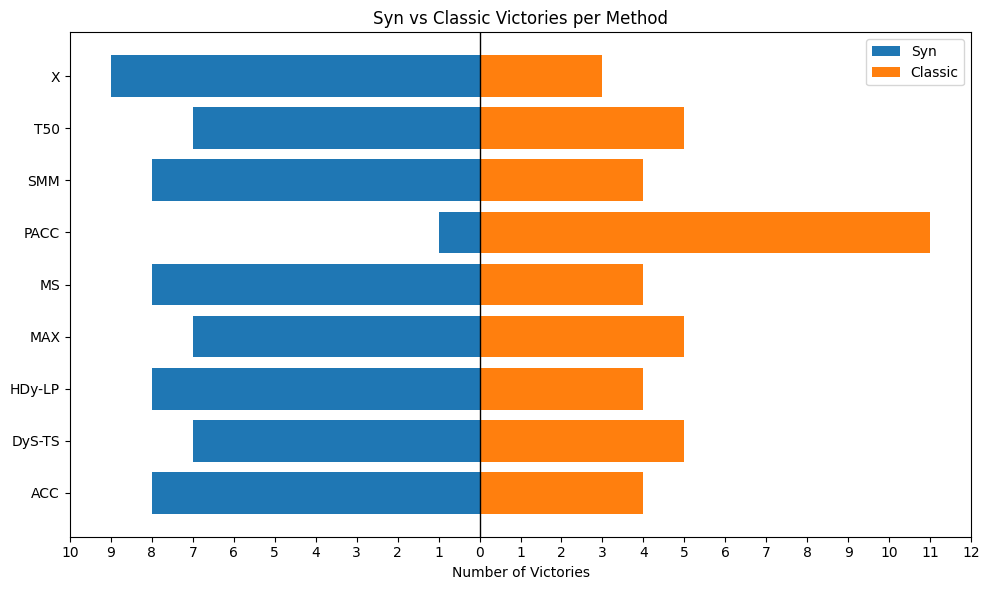

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter, MultipleLocator

# Get method names (without 'Syn'), as a flat list
methods = list(victories_df_sum.columns[9:18])

# Syn and Classic victories
syn_victories = [victories_df_sum[col].values[0] for col in victories_df_sum.columns[:9]]
classic_victories = [victories_df_sum[col].values[0] for col in victories_df_sum.columns[9:18]]
print(methods)
print(syn_victories)
print(classic_victories)

fig, ax = plt.subplots(figsize=(10, 6))
ax.xaxis.set_major_locator(MultipleLocator(1))

def abs_tick(x, pos):
    return str(int(abs(x)))

ax.xaxis.set_major_formatter(FuncFormatter(abs_tick))

y = range(len(methods))

# Plot Syn victories (left, negative direction)
ax.barh(y, [-v for v in syn_victories], color='tab:blue', label='Syn', align='center')
# Plot Classic victories (right, positive direction)
ax.barh(y, classic_victories, color='tab:orange', label='Classic', align='center')

# Draw vertical line in the middle
ax.axvline(0, color='black', linewidth=1)

# Method names as y-ticks
ax.set_yticks(y)
ax.set_yticklabels(methods)

ax.set_xlabel('Number of Victories')
ax.set_title('Syn vs Classic Victories per Method')
ax.legend(loc='upper right')
plt.tight_layout()
plt.show()

### Statistical analysis

In [171]:
def ae_dataset(df, dataset):
    df = df[df['dataset'] == dataset]
    result = pd.DataFrame(columns=df['Qnt'].unique())

    for qnt in df['Qnt'].unique():
        qnt_data = df[df['Qnt'] == qnt]['AE'].values
        result[qnt] = qnt_data

    return result

In [172]:
ae_datasets = []
for dataset in df_real['dataset'].unique():
    result = ae_dataset(df_real, dataset)
    ae_datasets.append({'dataset': dataset, 'data': result})

In [174]:
len(ae_datasets)

12

In [175]:
avila = ae_datasets[0]['data']
avila

,CC,HDy-LP,HDySyn,ACC,ACCSyn,X,XSyn,MAX,MAXSyn,MS,MSSyn,PACC,PACCSyn,T50,T50Syn,DyS-TS,DySyn-TS,SMM,SMMSyn
0,0.00,0.01,0.01,0.01,0.00,0.01,0.00,0.01,0.00,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.00,0.01,0.01
1,0.00,0.01,0.00,0.01,0.00,0.01,0.00,0.01,0.00,0.01,0.01,0.01,0.02,0.01,0.01,0.01,0.01,0.01,0.01
2,0.01,0.01,0.00,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.02,0.01,0.01,0.01,0.01,0.01,0.01
3,0.00,0.01,0.00,0.01,0.00,0.01,0.00,0.01,0.00,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.00,0.01,0.01
4,0.00,0.01,0.00,0.01,0.00,0.01,0.00,0.01,0.00,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5045,0.06,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.02,0.00,0.00,0.00,0.00
5046,0.15,0.00,0.01,0.00,0.07,0.00,0.06,0.00,0.10,0.00,0.02,0.04,0.05,0.00,0.07,0.00,0.03,0.00,0.05
5047,0.15,0.00,0.01,0.00,0.07,0.00,0.08,0.00,0.09,0.00,0.01,0.02,0.18,0.00,0.00,0.00,0.02,0.00,0.01
5048,0.07,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.00,0.00,0.00,0.00,0.00,0.01


In [185]:
# still needs to check if it is a normal distribution with Shapiro-Wilk test

from scipy.stats import ttest_rel

paired_columns = [
    ['ACC', 'ACCSyn'],
    ['X', 'XSyn'],
    ['MAX', 'MAXSyn'],
    ['T50', 'T50Syn'],
    ['MS', 'MSSyn'],
    ['HDy-LP', 'HDySyn'],
    ['DyS-TS', 'DySyn-TS'],
    ['SMM', 'SMMSyn'],
    ['PACC', 'PACCSyn']
]

def t_student_test(df, dataset, paired_columns):
    results = []
    for quantifiers in paired_columns:
        qnt = df[quantifiers[0]]
        syn = df[quantifiers[1]]
        stat, pval = ttest_rel(qnt, syn)
        result = {
            'dataset': dataset,
            'quantifiers': quantifiers,
            't_stat': stat,
            'p_value': pval
        }
        results.append(result)
    return results

#### P-value < 0.05 there is difference!

In [187]:
t_test_results = []

for dataset in ae_datasets:
    result = t_student_test(dataset['data'], dataset['dataset'], paired_columns)
    t_test_results.append(result)

t_test_results[11]

[{'dataset': 'Walking',
  'quantifiers': ['ACC', 'ACCSyn'],
  't_stat': np.float64(-10.119214820787656),
  'p_value': np.float64(7.654437870591877e-24)},
 {'dataset': 'Walking',
  'quantifiers': ['X', 'XSyn'],
  't_stat': np.float64(-1.6435999878657983),
  'p_value': np.float64(0.10032111874771188)},
 {'dataset': 'Walking',
  'quantifiers': ['MAX', 'MAXSyn'],
  't_stat': np.float64(0.5626629143735904),
  'p_value': np.float64(0.5736894231717355)},
 {'dataset': 'Walking',
  'quantifiers': ['T50', 'T50Syn'],
  't_stat': np.float64(3.2310797879932456),
  'p_value': np.float64(0.001241146721370578)},
 {'dataset': 'Walking',
  'quantifiers': ['MS', 'MSSyn'],
  't_stat': np.float64(2.9544093026555176),
  'p_value': np.float64(0.003147147798433261)},
 {'dataset': 'Walking',
  'quantifiers': ['HDy-LP', 'HDySyn'],
  't_stat': np.float64(16.80105657580099),
  'p_value': np.float64(1.1057351674363052e-61)},
 {'dataset': 'Walking',
  'quantifiers': ['DyS-TS', 'DySyn-TS'],
  't_stat': np.float64(-0

### Harder plot

In [ ]:
import plotly.express as px

# Define markers for each quantifier method
method_markers = {
    'ACC': 'circle', 'ACCSyn': 'circle-open',
    'CC': 'square', 
    'DyS-TS': 'diamond', 'DySyn-TS': 'diamond-open',
    'HDy-LP': 'triangle-up', 'HDySyn': 'triangle-up-open',
    'MAX': 'pentagon', 'MAXSyn': 'pentagon-open',
    'MS': 'hexagon', 'MSSyn': 'hexagon-open',
    'PACC': 'star', 'PACCSyn': 'star-open',
    'SMM': 'cross', 'SMMSyn': 'cross-open',
    'T50': 'x', 'T50Syn': 'x-open',
    'X': 'triangle-down', 'XSyn': 'triangle-down-open'
}

# Define colors: orange tones for normal methods, green tones for Syn methods
method_colors = {
    'ACC': '#FF8C00', 'ACCSyn': '#32CD32',
    'CC': '#FF7F50', 
    'DyS-TS': '#FFA500', 'DySyn-TS': '#228B22',
    'HDy-LP': '#FF6347', 'HDySyn': '#00FF00',
    'MAX': '#FF4500', 'MAXSyn': '#00FF32',
    'MS': '#FF8C69', 'MSSyn': '#32FF32',
    'PACC': '#FFA07A', 'PACCSyn': '#00FF7F',
    'SMM': '#FFB347', 'SMMSyn': '#98FB98',
    'T50': '#FFAB91', 'T50Syn': '#90EE90',
    'X': '#FFCC99', 'XSyn': '#9AFF9A'
}

def plot_h_analysis_by_dataset(df_real):
    datasets = list(df_real['dataset'].unique())
    dropdown = widgets.Dropdown(
        options=datasets,
        value=datasets[0],
        description='Dataset:'
    )

    def update_plot(change):
        selected_dataset = dropdown.value
        filtered_data = df_real[df_real['dataset'] == selected_dataset]
        
        # Group by Qnt and H, calculate mean AE
        grouped_h = filtered_data.groupby(['Qnt', 'H']).agg({'AE': 'mean'}).reset_index()
        
        # Create line plot with markers
        fig = px.line(
            grouped_h,
            x='H',
            y='AE',
            color='Qnt',
            title=f'Mean AE by H value for each Quantifier ({selected_dataset} dataset)',
            labels={'H': 'H value', 'AE': 'Mean AE'},
            markers=True,
            color_discrete_map=method_colors
        )
        
        # Update traces to use custom markers and set all to legendonly initially
        for trace in fig.data:
            qnt_name = trace.name
            if qnt_name in method_markers:
                trace.update(
                    marker=dict(symbol=method_markers[qnt_name], size=8),
                    # visible='legendonly'
                )
        
        clear_output(wait=True)
        fig.update_layout(width=1400, height=800)
        display(dropdown)
        fig.show()

    dropdown.observe(update_plot, names='value')
    display(dropdown)
    update_plot(None)

plot_h_analysis_by_dataset(df_real)

Dropdown(description='Dataset:', index=11, options=('Avila', 'Chess game', 'Covertype', 'Dermatology', 'HAR', …

Dropdown(description='Dataset:', index=1, options=('Avila', 'Chess game', 'Covertype', 'Dermatology', 'HAR', '…

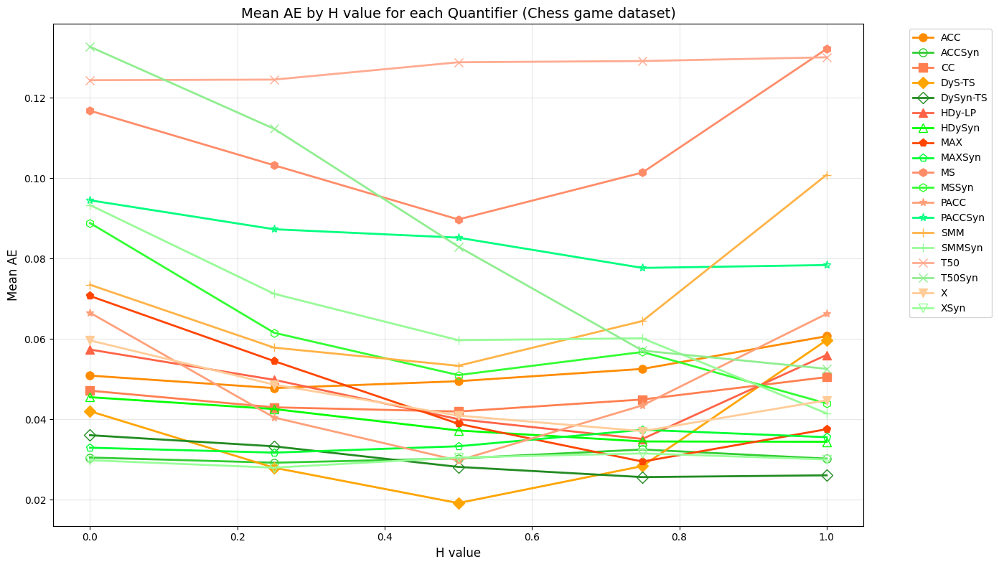

In [5]:
import numpy as np

import matplotlib.pyplot as plt

def plot_h_analysis_by_dataset_matplotlib(df_real):
    datasets = list(df_real['dataset'].unique())
    dropdown = widgets.Dropdown(
        options=datasets,
        value=datasets[0],
        description='Dataset:'
    )

    def update_plot(change):
        selected_dataset = dropdown.value
        filtered_data = df_real[df_real['dataset'] == selected_dataset]
        
        # Group by Qnt and H, calculate mean AE
        grouped_h = filtered_data.groupby(['Qnt', 'H']).agg({'AE': 'mean'}).reset_index()
        
        # Create matplotlib figure
        fig, ax = plt.subplots(figsize=(14, 8))
        
        # Plot each quantifier
        for qnt in grouped_h['Qnt'].unique():
            qnt_data = grouped_h[grouped_h['Qnt'] == qnt]
            color = method_colors.get(qnt, '#000000')
            marker = method_markers.get(qnt, 'o')
            
            # Convert plotly markers to matplotlib markers
            if marker == 'circle':
                mpl_marker = 'o'
            elif marker == 'circle-open':
                mpl_marker = 'o'
                ax.plot(qnt_data['H'], qnt_data['AE'], marker=mpl_marker, 
                       color=color, label=qnt, markersize=8, markerfacecolor='none', 
                       markeredgecolor=color, linewidth=2)
                continue
            elif marker == 'square':
                mpl_marker = 's'
            elif marker == 'diamond':
                mpl_marker = 'D'
            elif marker == 'diamond-open':
                mpl_marker = 'D'
                ax.plot(qnt_data['H'], qnt_data['AE'], marker=mpl_marker, 
                       color=color, label=qnt, markersize=8, markerfacecolor='none', 
                       markeredgecolor=color, linewidth=2)
                continue
            elif marker == 'triangle-up':
                mpl_marker = '^'
            elif marker == 'triangle-up-open':
                mpl_marker = '^'
                ax.plot(qnt_data['H'], qnt_data['AE'], marker=mpl_marker, 
                       color=color, label=qnt, markersize=8, markerfacecolor='none', 
                       markeredgecolor=color, linewidth=2)
                continue
            elif marker == 'pentagon':
                mpl_marker = 'p'
            elif marker == 'pentagon-open':
                mpl_marker = 'p'
                ax.plot(qnt_data['H'], qnt_data['AE'], marker=mpl_marker, 
                       color=color, label=qnt, markersize=8, markerfacecolor='none', 
                       markeredgecolor=color, linewidth=2)
                continue
            elif marker == 'hexagon':
                mpl_marker = 'h'
            elif marker == 'hexagon-open':
                mpl_marker = 'h'
                ax.plot(qnt_data['H'], qnt_data['AE'], marker=mpl_marker, 
                       color=color, label=qnt, markersize=8, markerfacecolor='none', 
                       markeredgecolor=color, linewidth=2)
                continue
            elif marker == 'star':
                mpl_marker = '*'
            elif marker == 'star-open':
                mpl_marker = '*'
                ax.plot(qnt_data['H'], qnt_data['AE'], marker=mpl_marker, 
                       color=color, label=qnt, markersize=8, markerfacecolor='none', 
                       markeredgecolor=color, linewidth=2)
                continue
            elif marker == 'cross':
                mpl_marker = '+'
            elif marker == 'cross-open':
                mpl_marker = '+'
                ax.plot(qnt_data['H'], qnt_data['AE'], marker=mpl_marker, 
                       color=color, label=qnt, markersize=8, markerfacecolor='none', 
                       markeredgecolor=color, linewidth=2)
                continue
            elif marker == 'x':
                mpl_marker = 'x'
            elif marker == 'x-open':
                mpl_marker = 'x'
                ax.plot(qnt_data['H'], qnt_data['AE'], marker=mpl_marker, 
                       color=color, label=qnt, markersize=8, markerfacecolor='none', 
                       markeredgecolor=color, linewidth=2)
                continue
            elif marker == 'triangle-down':
                mpl_marker = 'v'
            elif marker == 'triangle-down-open':
                mpl_marker = 'v'
                ax.plot(qnt_data['H'], qnt_data['AE'], marker=mpl_marker, 
                       color=color, label=qnt, markersize=8, markerfacecolor='none', 
                       markeredgecolor=color, linewidth=2)
                continue
            else:
                mpl_marker = 'o'
            
            ax.plot(qnt_data['H'], qnt_data['AE'], marker=mpl_marker, 
                   color=color, label=qnt, markersize=8, linewidth=2)
        
        ax.set_xlabel('H value', fontsize=12)
        ax.set_ylabel('Mean AE', fontsize=12)
        ax.set_title(f'Mean AE by H value for each Quantifier ({selected_dataset} dataset)', fontsize=14)
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        ax.grid(True, alpha=0.3)
        
        plt.tight_layout()
        clear_output(wait=True)
        display(dropdown)
        plt.show()

    dropdown.observe(update_plot, names='value')
    display(dropdown)
    update_plot(None)

plot_h_analysis_by_dataset_matplotlib(df_real)

In [9]:
df_real['dataset'].unique()

array(['Avila', 'Chess game', 'Covertype', 'Dermatology', 'HAR',
       'Land-use', 'Mfeat', 'Mosquitoes', 'Nursery', 'Phishing URL',
       'Satimage', 'Walking'], dtype=object)

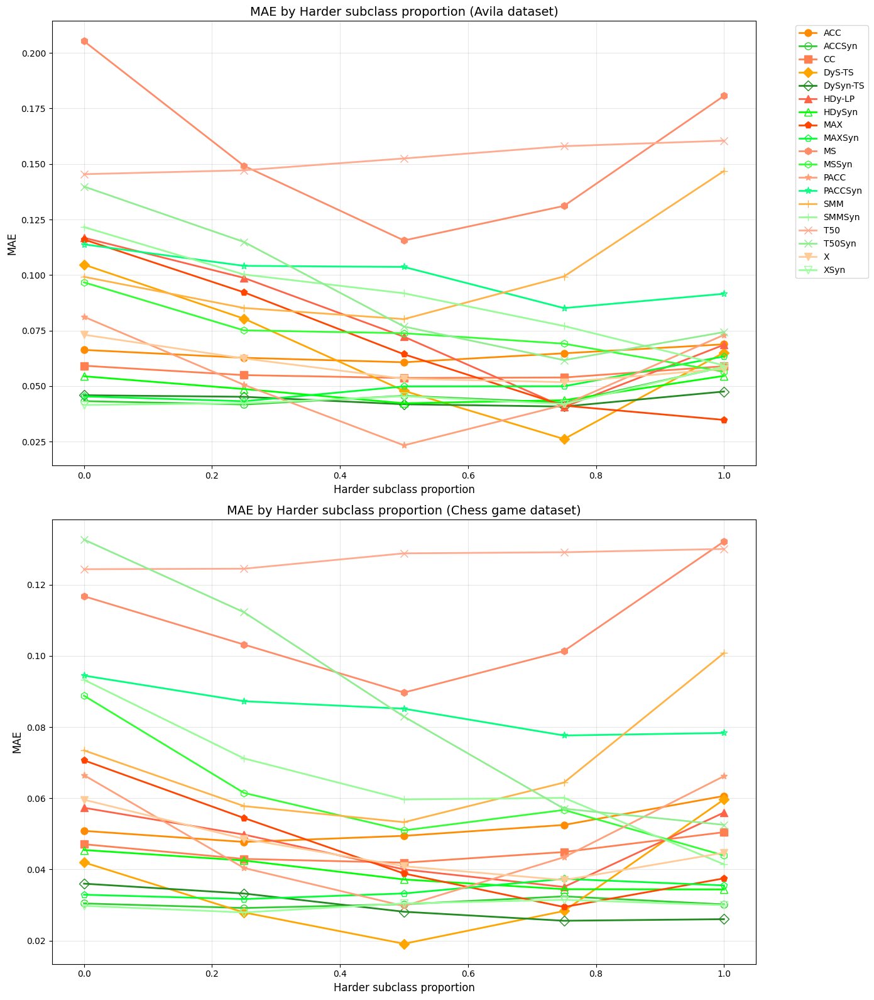

In [11]:
import numpy as np
import matplotlib.pyplot as plt

# Create double plot for Avila and Chess datasets
datasets_to_plot = ['Avila', 'Chess game']

fig, axes = plt.subplots(2, 1, figsize=(14, 16))

for idx, dataset_name in enumerate(datasets_to_plot):
    ax = axes[idx]
    filtered_data = df_real[df_real['dataset'] == dataset_name]
    
    # Group by Qnt and H, calculate mean AE
    grouped_h = filtered_data.groupby(['Qnt', 'H']).agg({'AE': 'mean'}).reset_index()
    
    # Plot each quantifier
    for qnt in grouped_h['Qnt'].unique():
        qnt_data = grouped_h[grouped_h['Qnt'] == qnt]
        color = method_colors.get(qnt, '#000000')
        marker = method_markers.get(qnt, 'o')
        
        # Convert plotly markers to matplotlib markers and handle open/closed variants
        if marker == 'circle':
            mpl_marker = 'o'
        elif marker == 'circle-open':
            mpl_marker = 'o'
            ax.plot(qnt_data['H'], qnt_data['AE'], marker=mpl_marker, 
                   color=color, label=qnt, markersize=8, markerfacecolor='none', 
                   markeredgecolor=color, linewidth=2)
            continue
        elif marker == 'square':
            mpl_marker = 's'
        elif marker == 'diamond':
            mpl_marker = 'D'
        elif marker == 'diamond-open':
            mpl_marker = 'D'
            ax.plot(qnt_data['H'], qnt_data['AE'], marker=mpl_marker, 
                   color=color, label=qnt, markersize=8, markerfacecolor='none', 
                   markeredgecolor=color, linewidth=2)
            continue
        elif marker == 'triangle-up':
            mpl_marker = '^'
        elif marker == 'triangle-up-open':
            mpl_marker = '^'
            ax.plot(qnt_data['H'], qnt_data['AE'], marker=mpl_marker, 
                   color=color, label=qnt, markersize=8, markerfacecolor='none', 
                   markeredgecolor=color, linewidth=2)
            continue
        elif marker == 'pentagon':
            mpl_marker = 'p'
        elif marker == 'pentagon-open':
            mpl_marker = 'p'
            ax.plot(qnt_data['H'], qnt_data['AE'], marker=mpl_marker, 
                   color=color, label=qnt, markersize=8, markerfacecolor='none', 
                   markeredgecolor=color, linewidth=2)
            continue
        elif marker == 'hexagon':
            mpl_marker = 'h'
        elif marker == 'hexagon-open':
            mpl_marker = 'h'
            ax.plot(qnt_data['H'], qnt_data['AE'], marker=mpl_marker, 
                   color=color, label=qnt, markersize=8, markerfacecolor='none', 
                   markeredgecolor=color, linewidth=2)
            continue
        elif marker == 'star':
            mpl_marker = '*'
        elif marker == 'star-open':
            mpl_marker = '*'
            ax.plot(qnt_data['H'], qnt_data['AE'], marker=mpl_marker, 
                   color=color, label=qnt, markersize=8, markerfacecolor='none', 
                   markeredgecolor=color, linewidth=2)
            continue
        elif marker == 'cross':
            mpl_marker = '+'
        elif marker == 'cross-open':
            mpl_marker = '+'
            ax.plot(qnt_data['H'], qnt_data['AE'], marker=mpl_marker, 
                   color=color, label=qnt, markersize=8, markerfacecolor='none', 
                   markeredgecolor=color, linewidth=2)
            continue
        elif marker == 'x':
            mpl_marker = 'x'
        elif marker == 'x-open':
            mpl_marker = 'x'
            ax.plot(qnt_data['H'], qnt_data['AE'], marker=mpl_marker, 
                   color=color, label=qnt, markersize=8, markerfacecolor='none', 
                   markeredgecolor=color, linewidth=2)
            continue
        elif marker == 'triangle-down':
            mpl_marker = 'v'
        elif marker == 'triangle-down-open':
            mpl_marker = 'v'
            ax.plot(qnt_data['H'], qnt_data['AE'], marker=mpl_marker, 
                   color=color, label=qnt, markersize=8, markerfacecolor='none', 
                   markeredgecolor=color, linewidth=2)
            continue
        else:
            mpl_marker = 'o'
        
        ax.plot(qnt_data['H'], qnt_data['AE'], marker=mpl_marker, 
               color=color, label=qnt, markersize=8, linewidth=2)
    
    ax.set_xlabel('Harder subclass proportion', fontsize=12)
    ax.set_ylabel('MAE', fontsize=12)
    ax.set_title(f'MAE by Harder subclass proportion ({dataset_name} dataset)', fontsize=14)
    ax.grid(True, alpha=0.3)
    
    # Only show legend for the first subplot to avoid repetition
    if idx == 0:
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

C:\Users\João Pedro\AppData\Local\Temp\ipykernel_28668\3185606105.py:25: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

C:\Users\João Pedro\AppData\Local\Temp\ipykernel_28668\3185606105.py:26: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



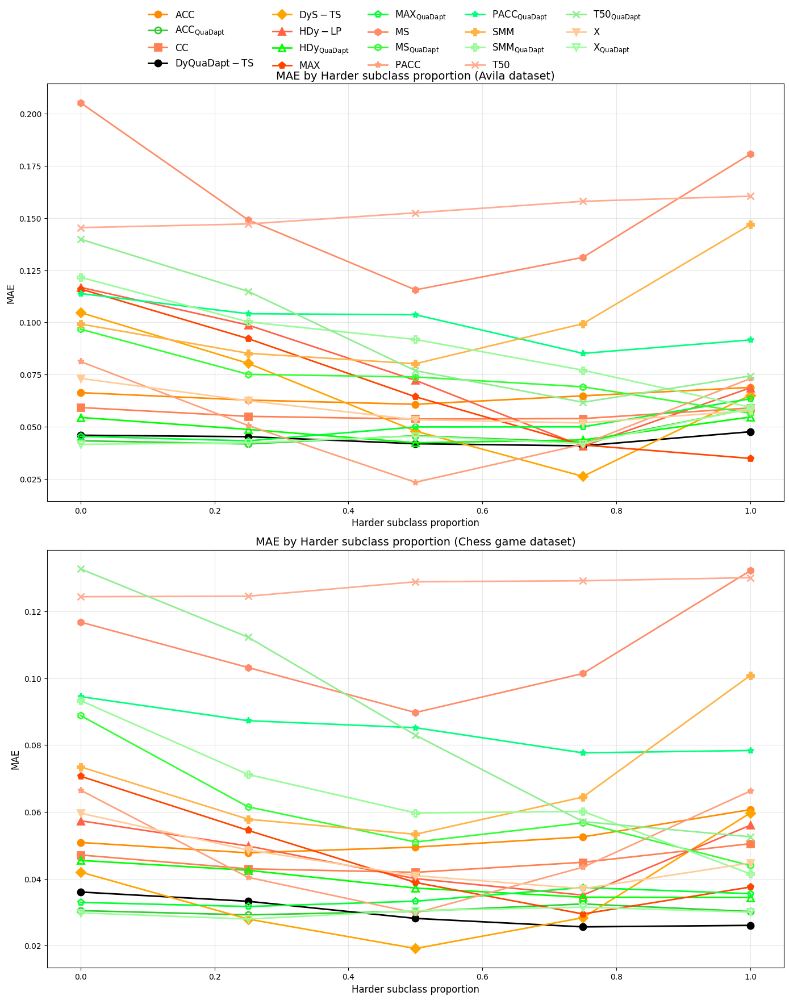

In [20]:
import numpy as np
import matplotlib.pyplot as plt

# Define proposal variable
proposal = 'QuaDapt'

# Create double plot for Avila and Chess datasets
datasets_to_plot = ['Avila', 'Chess game']

# Method pairs using proposal variable
method_pairs = [
    ('CC', f'CC{proposal}'),
    ('ACC', f'ACC{proposal}'),
    ('DyS', f'DyS{proposal}'),
    ('HDy', f'HDy{proposal}'),
    ('SMM', f'SMM{proposal}'),
    ('X', f'X{proposal}'),
    ('MAX', f'MAX{proposal}'),
    ('MS', f'MS{proposal}'),
    ('PACC', f'PACC{proposal}'),
    ('T50', f'T50{proposal}'),
]

n_methods = len(method_pairs)
classic_palette = matplotlib.cm.get_cmap('Reds', n_methods + 2)
syn_palette = matplotlib.cm.get_cmap('Greens', n_methods + 2)

# Assign a unique marker for each pair (example: cycle through a list or define your own)
pair_markers = ['', 'o', 'v', 'D', 'P', 'X', 'p', 'h', 's', '^']  # 10 unique markers

pair_marker_map = {}
for (classic, syn), marker in zip(method_pairs, pair_markers):
    pair_marker_map[classic] = marker
    pair_marker_map[syn] = marker

# Assign a unique color to each method in the pair
custom_color_map = {}
for idx, (classic_method, syn_method) in enumerate(method_pairs):
    if classic_method == 'CC':
        custom_color_map[classic_method] = 'tab:blue'
    else:
        custom_color_map[classic_method] = classic_palette(idx + 2)
    custom_color_map[syn_method] = syn_palette(idx + 2)

def format_label(name):
    if name.endswith('QuaDapt'):
        base = name.replace('QuaDapt', '')
        return fr"$\mathrm{{{base}}}_{{\mathrm{{QuaDapt}}}}$"
    else:
        return fr"$\mathrm{{{name}}}$"

# Create figure with legend at top
fig, axes = plt.subplots(2, 1, figsize=(14, 18))

# Prepare legend handles
legend_handles = []
legend_labels = []

for idx, dataset_name in enumerate(datasets_to_plot):
    ax = axes[idx]
    # Update df_real to use proposal instead of 'Syn'
    df_plot = df_real.copy()
    df_plot['Qnt'] = df_plot['Qnt'].apply(lambda x: x.replace('Syn', proposal) if 'Syn' in x else x)
    
    filtered_data = df_plot[df_plot['dataset'] == dataset_name]
    
    # Group by Qnt and H, calculate mean AE
    grouped_h = filtered_data.groupby(['Qnt', 'H']).agg({'AE': 'mean'}).reset_index()
    
    # Plot each quantifier
    for qnt in grouped_h['Qnt'].unique():
        qnt_data = grouped_h[grouped_h['Qnt'] == qnt]
        color = method_colors.get(qnt, '#000000')
        marker_style = method_markers.get(qnt, 'o')
        
        # Convert plotly markers to matplotlib markers
        plotly_to_mpl = {
            'circle': 'o', 'circle-open': 'o',
            'square': 's', 'square-open': 's', 
            'diamond': 'D', 'diamond-open': 'D',
            'triangle-up': '^', 'triangle-up-open': '^',
            'pentagon': 'p', 'pentagon-open': 'p',
            'hexagon': 'h', 'hexagon-open': 'h',
            'star': '*', 'star-open': '*',
            'cross': 'P', 'cross-open': 'P',
            'x': 'x', 'x-open': 'x',
            'triangle-down': 'v', 'triangle-down-open': 'v'
        }
        
        mpl_marker = plotly_to_mpl.get(marker_style, 'o')
        fillstyle = 'none' if 'open' in marker_style else 'full'
        
        line = ax.plot(qnt_data['H'], qnt_data['AE'], marker=mpl_marker, 
               color=color, label=format_label(qnt), markersize=8, linewidth=2,
               markeredgecolor=color, markeredgewidth=2, fillstyle=fillstyle)

        if idx == 0:
            legend_handles.extend(line)
            legend_labels.append(format_label(qnt))
    
    ax.set_xlabel('Harder subclass proportion', fontsize=12)
    ax.set_ylabel('MAE', fontsize=12)
    ax.set_title(f'MAE by Harder subclass proportion ({dataset_name} dataset)', fontsize=14)
    ax.grid(True, alpha=0.3)

# Add legend at the top of the figure
fig.legend(
    handles=legend_handles, labels=legend_labels,
    loc='upper center', bbox_to_anchor=(0.5, 0.98),
    ncol=5, fontsize=12, frameon=False
)

plt.tight_layout(rect=[0, 0, 1, 0.92])
plt.show()

C:\Users\joaop\AppData\Local\Temp\ipykernel_1480\817200286.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  classic_palette = matplotlib.cm.get_cmap('Reds', n_methods + 2)
C:\Users\joaop\AppData\Local\Temp\ipykernel_1480\817200286.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  syn_palette = matplotlib.cm.get_cmap('Greens', n_methods + 2)
C:\Users\joaop\AppData\Local\Temp\ipykernel_1480\817200286.py:169: UserWarning: Mismatched number of handles and labels: len(handles) = 17 len(labels) = 19
  fig.legend(


Ordered handles: 17
Ordered labels: ['$\\mathrm{ACC}$', '$\\mathrm{ACC}_{\\mathrm{QuaDapt}}$', '$\\mathrm{X}$', '$\\mathrm{X}_{\\mathrm{QuaDapt}}$', '$\\mathrm{CC}$', '$\\mathrm{MAX}$', '$\\mathrm{MAX}_{\\mathrm{QuaDapt}}$', '$\\mathrm{MS}$', '$\\mathrm{MS}_{\\mathrm{QuaDapt}}$', '$\\mathrm{T50}$', '$\\mathrm{T50}_{\\mathrm{QuaDapt}}$', '$\\mathrm{DyS}$', '$\\mathrm{DySyn}_{\\mathrm{QuaDapt}}$', '$\\mathrm{HDy}$', '$\\mathrm{HDy}_{\\mathrm{QuaDapt}}$', '$\\mathrm{SMM}$', '$\\mathrm{SMM}_{\\mathrm{QuaDapt}}$', '$\\mathrm{PACC}$', '$\\mathrm{PACC}_{\\mathrm{QuaDapt}}$']


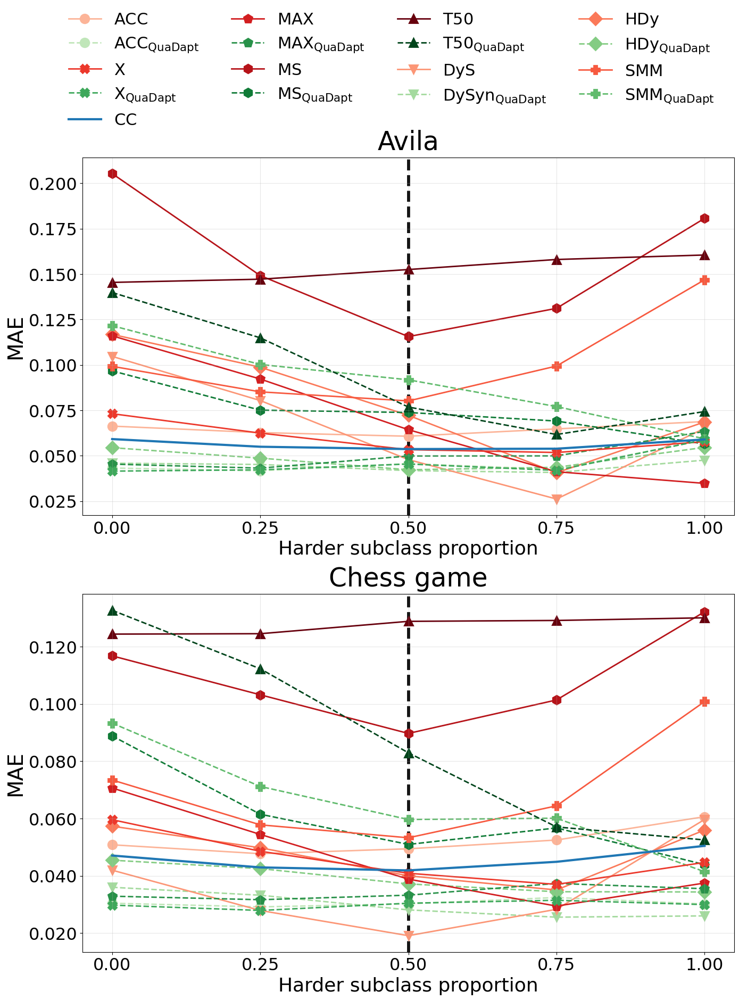

In [124]:
import numpy as np
import matplotlib.pyplot as plt

# Define proposal variable
proposal = 'QuaDapt'

# Create double plot for Avila and Chess datasets
datasets_to_plot = ['Avila', 'Chess game']

# Method pairs using proposal variable
method_pairs = [
    ('CC', f'CC{proposal}'),
    ('ACC', f'ACC{proposal}'),
    ('DyS', f'DySyn{proposal}'),
    ('HDy', f'HDy{proposal}'),
    ('SMM', f'SMM{proposal}'),
    ('X', f'X{proposal}'),
    ('MAX', f'MAX{proposal}'),
    ('MS', f'MS{proposal}'),
    ('PACC', f'PACC{proposal}'),
    ('T50', f'T50{proposal}'),
]

n_methods = len(method_pairs)
classic_palette = matplotlib.cm.get_cmap('Reds', n_methods + 2)
syn_palette = matplotlib.cm.get_cmap('Greens', n_methods + 2)

# Assign a unique marker for each pair
pair_markers = ['', 'o', 'v', 'D', 'P', 'X', 'p', 'h', 's', '^']

pair_marker_map = {}
for (classic, syn), marker in zip(method_pairs, pair_markers):
    pair_marker_map[classic] = marker
    pair_marker_map[syn] = marker

# Assign a unique color to each method in the pair
custom_color_map = {}
for idx, (classic_method, syn_method) in enumerate(method_pairs):
    if classic_method == 'CC':
        custom_color_map[classic_method] = 'tab:blue'
    else:
        custom_color_map[classic_method] = classic_palette(idx + 2)
    custom_color_map[syn_method] = syn_palette(idx + 2)

def format_label(name):
    if name.endswith(proposal):
        base = name.replace(proposal, '')
        return fr"$\mathrm{{{base}}}_{{\mathrm{{{proposal}}}}}$"
    else:
        return fr"$\mathrm{{{name}}}$"

# Create figure with legend at top
fig, axes = plt.subplots(2, 1, figsize=(14, 18))

# Prepare legend handles
legend_handles = []
legend_labels = []

for idx, dataset_name in enumerate(datasets_to_plot):
    ax = axes[idx]
    # Update df_real to use proposal instead of 'Syn'
    df_plot = df_real.copy()
    df_plot['Qnt'] = df_plot['Qnt'].apply(lambda x: x.replace('Syn', proposal) if 'Syn' in x else x)
    
    filtered_data = df_plot[df_plot['dataset'] == dataset_name]
    
    # Group by Qnt and H, calculate mean AE
    grouped_h = filtered_data.groupby(['Qnt', 'H']).agg({'AE': 'mean'}).reset_index()
    
    # Plot each quantifier
    for qnt in grouped_h['Qnt'].unique():

        # Skip PACC methods
        if qnt in ['PACC', 'PACCQuaDapt']:
            continue

        qnt_data = grouped_h[grouped_h['Qnt'] == qnt]

        # Fix the name mapping for special cases
        plot_qnt = qnt
        if qnt == 'DyS-TS':
            plot_qnt = 'DyS'
        elif qnt == 'DyQuaDapt-TS':
            plot_qnt = f'DySyn{proposal}'
        elif qnt == 'HDy-LP':
            plot_qnt = 'HDy'
        
        # Get color and marker from the defined maps
        color = custom_color_map.get(plot_qnt, 'tab:gray')
        marker = pair_marker_map.get(plot_qnt, 'o')
        
        # Determine line style and fill style
        if proposal in plot_qnt:
            linestyle = '--'
            fillstyle = 'none'
        else:
            linestyle = '-'
            fillstyle = 'full'
        
        # Special case for CC (no marker)
        if plot_qnt == 'CC':
            marker = None
            linestyle = '-'
            linewidth = 3
            zorder = 10
        else:
            linewidth = 2
            zorder = 1
        
        line = ax.plot(qnt_data['H'], qnt_data['AE'], 
                  marker=marker, 
                  color=color, 
                  label=format_label(plot_qnt), 
                  markersize=12, 
                  linewidth=linewidth,
                  linestyle=linestyle,
                  markeredgecolor=color, 
                  markeredgewidth=2,
                  zorder=zorder)

        if idx == 0:
            legend_handles.extend(line)
            legend_labels.append(format_label(plot_qnt))
    
    ax.set_title(f'{dataset_name}', fontsize=35, x=0.5, y=1.01)
    ax.set_xlabel('Harder subclass proportion', fontsize=26)
    ax.set_ylabel('MAE', fontsize=28)
    ax.tick_params(axis='x', labelsize=23)
    ax.set_xticks(df_real['H'].unique())
    ax.tick_params(axis='y', labelsize=23)
    ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x:.3f}'))
    ax.grid(True, alpha=0.3)
    ax.axvline(0.5, color='black', linestyle='--', linewidth=4, zorder=0)



# Replace the existing legend code with this hardcoded version:
hardcoded_ordered_labels = [
    r'$\mathrm{ACC}$',
    r'$\mathrm{ACC}_{\mathrm{QuaDapt}}$',
    r'$\mathrm{X}$',
    r'$\mathrm{X}_{\mathrm{QuaDapt}}$',
    r'$\mathrm{CC}$',
    r'$\mathrm{MAX}$',
    r'$\mathrm{MAX}_{\mathrm{QuaDapt}}$',
    r'$\mathrm{MS}$',
    r'$\mathrm{MS}_{\mathrm{QuaDapt}}$',
    r'$\mathrm{T50}$',
    r'$\mathrm{T50}_{\mathrm{QuaDapt}}$',
    r'$\mathrm{DyS}$',
    r'$\mathrm{DySyn}_{\mathrm{QuaDapt}}$',
    r'$\mathrm{HDy}$',
    r'$\mathrm{HDy}_{\mathrm{QuaDapt}}$',
    r'$\mathrm{SMM}$',
    r'$\mathrm{SMM}_{\mathrm{QuaDapt}}$',
    r'$\mathrm{PACC}$',
    r'$\mathrm{PACC}_{\mathrm{QuaDapt}}$',
]

# You'll need to match these with the corresponding handles
hardcoded_ordered_handles = []
for target_label in hardcoded_ordered_labels:
    for handle, label in zip(legend_handles, legend_labels):
        if label == target_label:
            hardcoded_ordered_handles.append(handle)
            break

# Update legend to use 8 columns for first two rows, then 3 for the last row
fig.legend(
    handles=hardcoded_ordered_handles, labels=hardcoded_ordered_labels,
    loc='upper center', bbox_to_anchor=(0.529, 1.05),
    ncol=4, fontsize=22, frameon=False
)

print("Ordered handles:", len(hardcoded_ordered_handles))
print("Ordered labels:", hardcoded_ordered_labels)

plt.tight_layout(rect=[0, 0, 1, 0.92])
plt.savefig('harder_plot.pdf', format='pdf', bbox_inches='tight')
plt.show()

# print(legend_handles)
# print(legend_labels)

C:\Users\joaop\AppData\Local\Temp\ipykernel_1480\305507413.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  classic_palette = matplotlib.cm.get_cmap('Reds', n_methods + 2)
C:\Users\joaop\AppData\Local\Temp\ipykernel_1480\305507413.py:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  syn_palette = matplotlib.cm.get_cmap('Greens', n_methods + 2)


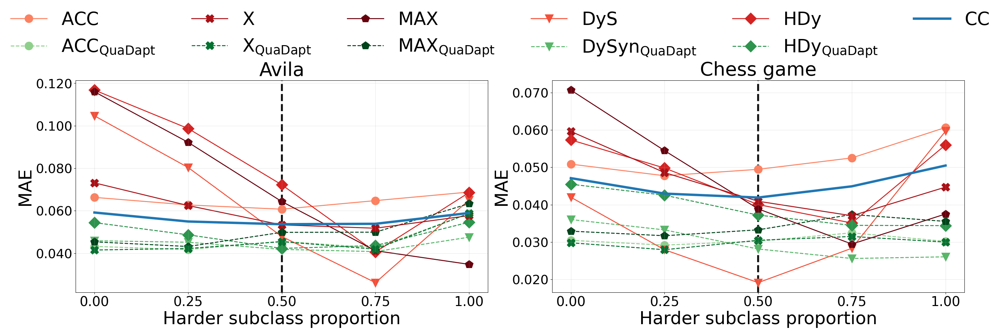

In [218]:
import numpy as np
import matplotlib.pyplot as plt

# Define proposal variable
proposal = 'QuaDapt'

# Create double plot for Avila and Chess datasets
datasets_to_plot = ['Avila', 'Chess game']

# Method pairs using proposal variable - REMOVED T50, MS, SMM pairs
method_pairs = [
    ('CC', f'CC{proposal}'),
    ('ACC', f'ACC{proposal}'),
    ('DyS', f'DySyn{proposal}'),
    ('HDy', f'HDy{proposal}'),
    ('X', f'X{proposal}'),
    ('MAX', f'MAX{proposal}'),
]

n_methods = len(method_pairs)
classic_palette = matplotlib.cm.get_cmap('Reds', n_methods + 2)
syn_palette = matplotlib.cm.get_cmap('Greens', n_methods + 2)

# Assign a unique marker for each pair - REMOVED markers for T50, MS, SMM
pair_markers = ['', 'o', 'v', 'D', 'X', 'p', 's']

pair_marker_map = {}
for (classic, syn), marker in zip(method_pairs, pair_markers):
    pair_marker_map[classic] = marker
    pair_marker_map[syn] = marker

# Assign a unique color to each method in the pair
custom_color_map = {}
for idx, (classic_method, syn_method) in enumerate(method_pairs):
    if classic_method == 'CC':
        custom_color_map[classic_method] = 'tab:blue'
    else:
        custom_color_map[classic_method] = classic_palette(idx + 2)
    custom_color_map[syn_method] = syn_palette(idx + 2)

def format_label(name):
    if name.endswith(proposal):
        base = name.replace(proposal, '')
        return fr"$\mathrm{{{base}}}_{{\mathrm{{{proposal}}}}}$"
    else:
        return fr"$\mathrm{{{name}}}$"

# Create figure with subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(28, 9))

# Prepare legend handles
legend_handles = []
legend_labels = []

for idx, dataset_name in enumerate(datasets_to_plot):
    ax = axes[idx]
    # Update df_real to use proposal instead of 'Syn'
    df_plot = df_real.copy()
    df_plot['Qnt'] = df_plot['Qnt'].apply(lambda x: x.replace('Syn', proposal) if 'Syn' in x else x)
    
    filtered_data = df_plot[df_plot['dataset'] == dataset_name]
    
    # Group by Qnt and H, calculate mean AE
    grouped_h = filtered_data.groupby(['Qnt', 'H']).agg({'AE': 'mean'}).reset_index()
    
    # Plot each quantifier
    for qnt in grouped_h['Qnt'].unique():

        # Skip PACC methods AND the removed methods
        if qnt in ['PACC', 'PACCQuaDapt', 'T50', 'T50QuaDapt', 'MS', 'MSQuaDapt', 'SMM', 'SMMQuaDapt']:
            continue

        qnt_data = grouped_h[grouped_h['Qnt'] == qnt]

        # Fix the name mapping for special cases
        plot_qnt = qnt
        if qnt == 'DyS-TS':
            plot_qnt = 'DyS'
        elif qnt == 'DyQuaDapt-TS':
            plot_qnt = f'DySyn{proposal}'
        elif qnt == 'HDy-LP':
            plot_qnt = 'HDy'
        
        # Get color and marker from the defined maps
        color = custom_color_map.get(plot_qnt, 'tab:gray')
        marker = pair_marker_map.get(plot_qnt, 'o')
        
        # Determine line style and fill style
        if proposal in plot_qnt:
            linestyle = '--'
            fillstyle = 'none'
        else:
            linestyle = '-'
            fillstyle = 'full'
        
        # Special case for CC (no marker)
        if plot_qnt == 'CC':
            marker = None
            linestyle = '-'
            linewidth = 5
            zorder = 10
        else:
            linewidth = 2
            zorder = 1
        
        line = ax.plot(qnt_data['H'], qnt_data['AE'], 
                  marker=marker, 
                  color=color, 
                  label=format_label(plot_qnt), 
                  markersize=16, 
                  linewidth=linewidth,
                  linestyle=linestyle,
                  markeredgecolor=color, 
                  markeredgewidth=2,
                  zorder=zorder)

        if idx == 0:
            legend_handles.extend(line)
            legend_labels.append(format_label(plot_qnt))
    
    ax.set_title(f'{dataset_name}', fontsize=40, x=0.5, y=1.01)
    ax.set_xlabel('Harder subclass proportion', fontsize=37)
    ax.set_ylabel('MAE', fontsize=37)
    ax.tick_params(axis='x', labelsize=28)
    ax.set_xticks(df_real['H'].unique())
    ax.tick_params(axis='y', labelsize=27)
    ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x:.3f}'))
    ax.grid(True, alpha=0.3)
    ax.axvline(0.5, color='black', linestyle='--', linewidth=4, zorder=0)

# Updated hardcoded legend order - REMOVED T50, MS, SMM methods
hardcoded_ordered_labels = [
    r'$\mathrm{ACC}$',
    r'$\mathrm{ACC}_{\mathrm{QuaDapt}}$',
    r'$\mathrm{X}$',
    r'$\mathrm{X}_{\mathrm{QuaDapt}}$',
    r'$\mathrm{MAX}$',
    r'$\mathrm{MAX}_{\mathrm{QuaDapt}}$',
    r'$\mathrm{DyS}$',  
    r'$\mathrm{DySyn}_{\mathrm{QuaDapt}}$',
    r'$\mathrm{HDy}$',
    r'$\mathrm{HDy}_{\mathrm{QuaDapt}}$',
    r'$\mathrm{CC}$',
]

# You'll need to match these with the corresponding handles
hardcoded_ordered_handles = []
for target_label in hardcoded_ordered_labels:
    for handle, label in zip(legend_handles, legend_labels):
        if label == target_label:
            hardcoded_ordered_handles.append(handle)
            break

# Update legend to use 4 columns instead of 6 (since we have fewer methods)
fig.legend(
    handles=hardcoded_ordered_handles, labels=hardcoded_ordered_labels,
    loc='upper center', bbox_to_anchor=(0.51, 1.1),
    ncol=6, fontsize=38, frameon=False
)

plt.tight_layout(rect=[0, 0, 1, 0.90])
plt.savefig('harder_plot.pdf', format='pdf', bbox_inches='tight')
plt.show()


C:\Users\joaop\AppData\Local\Temp\ipykernel_1480\469343818.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  classic_palette = matplotlib.cm.get_cmap('Reds', n_methods + 2)
C:\Users\joaop\AppData\Local\Temp\ipykernel_1480\469343818.py:22: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  syn_palette = matplotlib.cm.get_cmap('Greens', n_methods + 2)


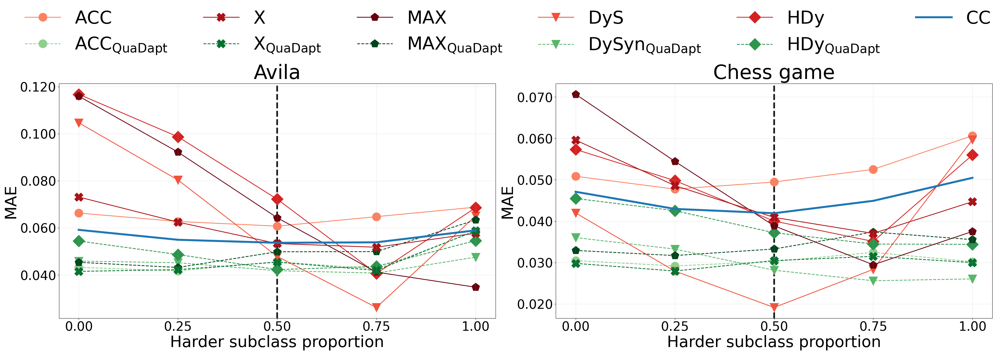

In [252]:
import numpy as np
import matplotlib.pyplot as plt

# Define proposal variable
proposal = 'QuaDapt'

# Create double plot for Avila and Chess datasets
datasets_to_plot = ['Avila', 'Chess game']

# Method pairs using proposal variable - REMOVED T50, MS, SMM pairs
method_pairs = [
    ('CC', f'CC{proposal}'),
    ('ACC', f'ACC{proposal}'),
    ('DyS', f'DySyn{proposal}'),
    ('HDy', f'HDy{proposal}'),
    ('X', f'X{proposal}'),
    ('MAX', f'MAX{proposal}'),
]

n_methods = len(method_pairs)
classic_palette = matplotlib.cm.get_cmap('Reds', n_methods + 2)
syn_palette = matplotlib.cm.get_cmap('Greens', n_methods + 2)

# Assign a unique marker for each pair - REMOVED markers for T50, MS, SMM
pair_markers = ['', 'o', 'v', 'D', 'X', 'p', 's']

pair_marker_map = {}
for (classic, syn), marker in zip(method_pairs, pair_markers):
    pair_marker_map[classic] = marker
    pair_marker_map[syn] = marker

# Assign a unique color to each method in the pair
custom_color_map = {}
for idx, (classic_method, syn_method) in enumerate(method_pairs):
    if classic_method == 'CC':
        custom_color_map[classic_method] = 'tab:blue'
    else:
        custom_color_map[classic_method] = classic_palette(idx + 2)
    custom_color_map[syn_method] = syn_palette(idx + 2)

def format_label(name):
    if name.endswith(proposal):
        base = name.replace(proposal, '')
        return fr"$\mathrm{{{base}}}_{{\mathrm{{{proposal}}}}}$"
    else:
        return fr"$\mathrm{{{name}}}$"

# Create figure with subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(35, 11.5))

# Prepare legend handles
legend_handles = []
legend_labels = []

for idx, dataset_name in enumerate(datasets_to_plot):
    ax = axes[idx]
    # Update df_real to use proposal instead of 'Syn'
    df_plot = df_real.copy()
    df_plot['Qnt'] = df_plot['Qnt'].apply(lambda x: x.replace('Syn', proposal) if 'Syn' in x else x)
    
    filtered_data = df_plot[df_plot['dataset'] == dataset_name]
    
    # Group by Qnt and H, calculate mean AE
    grouped_h = filtered_data.groupby(['Qnt', 'H']).agg({'AE': 'mean'}).reset_index()
    
    # Plot each quantifier
    for qnt in grouped_h['Qnt'].unique():

        # Skip PACC methods AND the removed methods
        if qnt in ['PACC', 'PACCQuaDapt', 'T50', 'T50QuaDapt', 'MS', 'MSQuaDapt', 'SMM', 'SMMQuaDapt']:
            continue

        qnt_data = grouped_h[grouped_h['Qnt'] == qnt]

        # Fix the name mapping for special cases
        plot_qnt = qnt
        if qnt == 'DyS-TS':
            plot_qnt = 'DyS'
        elif qnt == 'DyQuaDapt-TS':
            plot_qnt = f'DySyn{proposal}'
        elif qnt == 'HDy-LP':
            plot_qnt = 'HDy'
        
        # Get color and marker from the defined maps
        color = custom_color_map.get(plot_qnt, 'tab:gray')
        marker = pair_marker_map.get(plot_qnt, 'o')
        
        # Determine line style and fill style
        if proposal in plot_qnt:
            linestyle = '--'
            fillstyle = 'none'
        else:
            linestyle = '-'
            fillstyle = 'full'
        
        # Special case for CC (no marker)
        if plot_qnt == 'CC':
            marker = None
            linestyle = '-'
            linewidth = 5
            zorder = 10
        else:
            linewidth = 2
            zorder = 1
        
        line = ax.plot(qnt_data['H'], qnt_data['AE'], 
                  marker=marker, 
                  color=color, 
                  label=format_label(plot_qnt), 
                  markersize=20, 
                  linewidth=linewidth,
                  linestyle=linestyle,
                  markeredgecolor=color, 
                  markeredgewidth=2,
                  zorder=zorder)

        if idx == 0:
            legend_handles.extend(line)
            legend_labels.append(format_label(plot_qnt))
    
    ax.set_title(f'{dataset_name}', fontsize=50, x=0.5, y=1.01)
    ax.set_xlabel('Harder subclass proportion', fontsize=40)
    ax.set_ylabel('MAE', fontsize=40)
    ax.tick_params(axis='x', labelsize=32)
    ax.set_xticks(df_real['H'].unique())
    ax.tick_params(axis='y', labelsize=32)
    if idx == 0:  # First subplot (Avila)
        ax.set_yticks([0.040, 0.060, 0.080, 0.100, 0.120])
    else:  # Second subplot (Chess game)
        ax.set_yticks([0.020, 0.030, 0.040, 0.050, 0.060, 0.070])
    ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x:.3f}'))
    ax.grid(True, alpha=0.3)
    ax.axvline(0.5, color='black', linestyle='--', linewidth=4, zorder=0)

# Updated hardcoded legend order - REMOVED T50, MS, SMM methods
hardcoded_ordered_labels = [
    r'$\mathrm{ACC}$',
    r'$\mathrm{ACC}_{\mathrm{QuaDapt}}$',
    r'$\mathrm{X}$',
    r'$\mathrm{X}_{\mathrm{QuaDapt}}$',
    r'$\mathrm{MAX}$',
    r'$\mathrm{MAX}_{\mathrm{QuaDapt}}$',
    r'$\mathrm{DyS}$',  
    r'$\mathrm{DySyn}_{\mathrm{QuaDapt}}$',
    r'$\mathrm{HDy}$',
    r'$\mathrm{HDy}_{\mathrm{QuaDapt}}$',
    r'$\mathrm{CC}$',
]

# You'll need to match these with the corresponding handles
hardcoded_ordered_handles = []
for target_label in hardcoded_ordered_labels:
    for handle, label in zip(legend_handles, legend_labels):
        if label == target_label:
            hardcoded_ordered_handles.append(handle)
            break

# Update legend to use 4 columns instead of 6 (since we have fewer methods)
fig.legend(
    handles=hardcoded_ordered_handles, labels=hardcoded_ordered_labels,
    loc='upper center', bbox_to_anchor=(0.51, 1.1),
    ncol=6, fontsize=45, frameon=False
)

plt.tight_layout(rect=[0, 0, 1, 0.90])
plt.savefig('harder_plot.svg', format='svg', bbox_inches='tight')
plt.show()